In [1]:
from pathlib import Path
import sys

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

sys.path.append("../")

from src.analytics.static_analysis import get_cluster_colors
from src.plots.hex_maps import (
    hexes_plots_n,
)
from src.readers.geom_reader import load_geodata
from src.readers.hydro_series import load_metrics_from_directory
from src.timeseries_stats.metrics import evaluate_model
from src.utils.logger import setup_logger

plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

log = setup_logger("chapter_two", log_file="../logs/chapter_two.log")
# Base paths for optimization results
BASE_PATHS = {
    "GR4J": Path("../data/optimization/gr4j_simple"),
    "HBV": Path("../data/optimization/hbv_simple"),
    "RFR": Path("../data/optimization/rfr_simple"),
}
# Load watershed geometries and gauge locations
ws, gauges = load_geodata(folder_depth="../")
common_index = gauges.index.to_list()
basemap_data = gpd.read_file("../data/geometry/basemap_2023.gpkg")
# Load cluster assignments (from Chapter 1)
gauge_mapping = pd.read_csv(
    "../res/chapter_one/gauge_hybrid_mapping.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)

print(f"Loaded {len(gauges)} gauges with hybrid classification")

2025-12-04 18:56:26 | WARNING  | PhDLogger | trend_analysis | ⚠️  pymannkendall not available. Using basic Mann-Kendall implementation.


Loaded 996 gauges with hybrid classification


In [10]:
gauge_mapping.rename(columns={"hybri": "hybrid_class"}, inplace=True)

In [2]:
# Load data for all models
model_data = {}
for model_name, base_path in BASE_PATHS.items():
    print(f"Loading {model_name} results from {base_path}...")
    model_data[model_name] = load_metrics_from_directory(base_path)
    print(f"  Found {len(model_data[model_name])} gauges")


Loading GR4J results from ../data/optimization/gr4j_simple...
  Found 996 gauges
Loading HBV results from ../data/optimization/hbv_simple...
  Found 996 gauges
Loading HBV results from ../data/optimization/hbv_simple...
  Found 996 gauges
Loading RFR results from ../data/optimization/rfr_simple...
  Found 996 gauges
Loading RFR results from ../data/optimization/rfr_simple...
  Found 996 gauges
  Found 996 gauges


In [3]:
# Examine structure of model_data
for model_name in model_data:
    print(f"\n{model_name}:")
    sample_gauge = next(iter(model_data[model_name]))
    print(f"  Sample gauge: {sample_gauge}")
    print(f"  Available datasets: {list(model_data[model_name][sample_gauge].keys())}")

    # Show structure of first dataset
    first_dataset = next(iter(model_data[model_name][sample_gauge]))
    print(f"  Structure of '{first_dataset}':")
    print(f"    Keys: {list(model_data[model_name][sample_gauge][first_dataset].keys())}")



GR4J:
  Sample gauge: 75257
  Available datasets: ['e5l', 'gpcp', 'e5', 'mswep']
  Structure of 'e5l':
    Keys: ['NSE', 'KGE', 'PBIAS', 'RMSE', 'MAE', 'logNSE', 'R2', 'r', 'PFE']

HBV:
  Sample gauge: 9166
  Available datasets: ['e5l', 'gpcp', 'e5', 'mswep']
  Structure of 'e5l':
    Keys: ['NSE', 'KGE', 'PBIAS', 'RMSE', 'MAE', 'logNSE', 'R2', 'r', 'PFE']

RFR:
  Sample gauge: 19185
  Available datasets: ['e5l', 'gpcp', 'e5', 'mswep']
  Structure of 'e5l':
    Keys: ['NSE', 'KGE', 'PBIAS', 'RMSE', 'MAE', 'logNSE', 'R2', 'r', 'PFE']


In [4]:
# Create separate dataframes for each model-dataset combination
dataset_dfs = {}

for model_name, model_dict in model_data.items():
    # Get available datasets from first gauge
    _sample_gauge = next(iter(model_dict))
    _datasets = list(model_dict[_sample_gauge].keys())

    for _dataset_name in _datasets:
        # Create dataframe for this model-dataset combination
        _rows = []

        for _gauge_id, _gauge_data in model_dict.items():
            if _dataset_name in _gauge_data:
                _metrics = _gauge_data[_dataset_name]
                _row = {"gauge_id": _gauge_id}
                _row.update(_metrics)
                _rows.append(_row)

        # Create dataframe
        _df_name = f"{model_name.lower()}_{_dataset_name}"
        _df = pd.DataFrame(_rows).set_index("gauge_id")

        # Reindex to common_index to ensure all gauges are present (fill missing with NaN)
        _df = _df.reindex(common_index)
        dataset_dfs[_df_name] = _df

        _missing_count = _df.isna().all(axis=1).sum()
        print(
            f"Created {_df_name}: {len(_df)} gauges × {len(_df.columns)} metrics "
            f"({_missing_count} missing)"
        )

print(f"\nTotal dataframes created: {len(dataset_dfs)}")
print(f"Available dataframes: {list(dataset_dfs.keys())}")


Created gr4j_e5l: 996 gauges × 9 metrics (2 missing)
Created gr4j_gpcp: 996 gauges × 9 metrics (1 missing)
Created gr4j_e5: 996 gauges × 9 metrics (0 missing)
Created gr4j_mswep: 996 gauges × 9 metrics (2 missing)
Created hbv_e5l: 996 gauges × 9 metrics (0 missing)
Created hbv_gpcp: 996 gauges × 9 metrics (0 missing)
Created hbv_e5: 996 gauges × 9 metrics (0 missing)
Created hbv_mswep: 996 gauges × 9 metrics (0 missing)
Created rfr_e5l: 996 gauges × 9 metrics (0 missing)
Created rfr_gpcp: 996 gauges × 9 metrics (0 missing)
Created rfr_e5: 996 gauges × 9 metrics (0 missing)
Created rfr_mswep: 996 gauges × 9 metrics (0 missing)

Total dataframes created: 12
Available dataframes: ['gr4j_e5l', 'gr4j_gpcp', 'gr4j_e5', 'gr4j_mswep', 'hbv_e5l', 'hbv_gpcp', 'hbv_e5', 'hbv_mswep', 'rfr_e5l', 'rfr_gpcp', 'rfr_e5', 'rfr_mswep']


In [5]:
# Create individual variables for easy access
gr4j_e5l = dataset_dfs["gr4j_e5l"]
gr4j_gpcp = dataset_dfs["gr4j_gpcp"]
gr4j_e5 = dataset_dfs["gr4j_e5"]
gr4j_mswep = dataset_dfs["gr4j_mswep"]

hbv_e5l = dataset_dfs["hbv_e5l"]
hbv_gpcp = dataset_dfs["hbv_gpcp"]
hbv_e5 = dataset_dfs["hbv_e5"]
hbv_mswep = dataset_dfs["hbv_mswep"]

rfr_e5l = dataset_dfs["rfr_e5l"]
rfr_gpcp = dataset_dfs["rfr_gpcp"]
rfr_e5 = dataset_dfs["rfr_e5"]
rfr_mswep = dataset_dfs["rfr_mswep"]

print("✓ Created individual dataframe variables:")
print("  GR4J: gr4j_e5l, gr4j_gpcp, gr4j_e5, gr4j_mswep")
print("  HBV:  hbv_e5l, hbv_gpcp, hbv_e5, hbv_mswep")
print("  RFR:  rfr_e5l, rfr_gpcp, rfr_e5, rfr_mswep")


✓ Created individual dataframe variables:
  GR4J: gr4j_e5l, gr4j_gpcp, gr4j_e5, gr4j_mswep
  HBV:  hbv_e5l, hbv_gpcp, hbv_e5, hbv_mswep
  RFR:  rfr_e5l, rfr_gpcp, rfr_e5, rfr_mswep


In [6]:
# Optional: Load additional LSTM variants if needed
lstm_single = pd.read_csv(
    "../data/optimization/lstm/Single_LSTM_table.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)
lstm_single = lstm_single.loc[common_index, :]
lstm_no_static = pd.read_csv(
    "../data/optimization/lstm/LSTM_no_static_res.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)
lstm_no_static = lstm_no_static.loc[common_index, :]


In [7]:
import pickle

lstm_pathes = {
    "gpcp": "../data/lstm_configs/model_runs/cudalstm_q_mm_day_gpcp_no_autocorr_static_1203_080402/test/model_epoch024/test_results.p",
    "e5": "../data/lstm_configs/model_runs/cudalstm_q_mm_day_era5_no_autocorr_static_1203_220232/test/model_epoch020/test_results.p",
    "e5l": "../data/lstm_configs/model_runs/cudalstm_q_mm_day_era5l_no_autocorr_static_1003_133332/test/model_epoch026/test_results.p",
    "mswep": "../data/lstm_configs/model_runs/cudalstm_q_mm_day_mswep_no_autocorr_static_1103_191754/test/model_epoch024/test_results.p",
    "ealstm": "../data/lstm_configs/model_runs/ealstm_q_mm_day_mswep_no_static_0205_144958/test/model_epoch038/test_results.p",
}
# Process LSTM pickle files and create dataframes with comprehensive metrics
lstm_dataset_dfs = {}

for _dataset_name, _pickle_path in lstm_pathes.items():
    print(f"Processing LSTM {_dataset_name}...")

    with open(_pickle_path, "rb") as _f:
        _lstm_data = pickle.load(_f)

    _rows = []
    _errors = 0

    for _gauge_id, _gauge_results in _lstm_data.items():
        if _gauge_id in common_index:
            try:
                # Extract observed and simulated data
                _xr_data = _gauge_results["1D"]["xr"]
                _obs = np.asarray(_xr_data["q_mm_day_obs"], dtype=float).flatten()
                _sim = np.asarray(_xr_data["q_mm_day_sim"], dtype=float).flatten()

                # Calculate comprehensive metrics
                _metrics = evaluate_model(observed=_obs, simulated=_sim)

                # Add gauge_id to metrics
                _metrics["gauge_id"] = _gauge_id
                _rows.append(_metrics)

            except Exception as _e:
                _errors += 1
                log.warning(
                    f"Error processing gauge {_gauge_id} for LSTM {_dataset_name}: {_e}"
                )
                continue
        else:
            continue

    # Create dataframe
    _df_name = f"lstm_{_dataset_name}"
    _df = pd.DataFrame(_rows).set_index("gauge_id")

    # Reindex to common_index to ensure all gauges are present (fill missing with NaN)
    _df = _df.reindex(common_index)
    lstm_dataset_dfs[_df_name] = _df

    _missing_count = _df.isna().all(axis=1).sum()
    print(
        f"  Created {_df_name}: {len(_df)} gauges × {len(_df.columns)} metrics "
        f"({_missing_count} missing)"
    )
    if _errors > 0:
        print(f"  ⚠ Skipped {_errors} gauges due to errors")

print(f"\n✓ Total LSTM dataframes created: {len(lstm_dataset_dfs)}")
print(f"Available LSTM dataframes: {list(lstm_dataset_dfs.keys())}")
# Create individual LSTM variables for easy access (matching the naming convention)
lstm_e5l = lstm_dataset_dfs["lstm_e5l"]
lstm_gpcp = lstm_dataset_dfs["lstm_gpcp"]
lstm_e5 = lstm_dataset_dfs["lstm_e5"]
lstm_mswep = lstm_dataset_dfs["lstm_mswep"]
ealstm_mswep = lstm_dataset_dfs["lstm_ealstm"]


Processing LSTM gpcp...
  Created lstm_gpcp: 996 gauges × 9 metrics (0 missing)
Processing LSTM e5...
  Created lstm_gpcp: 996 gauges × 9 metrics (0 missing)
Processing LSTM e5...
  Created lstm_e5: 996 gauges × 9 metrics (0 missing)
Processing LSTM e5l...
  Created lstm_e5: 996 gauges × 9 metrics (0 missing)
Processing LSTM e5l...
  Created lstm_e5l: 996 gauges × 9 metrics (0 missing)
Processing LSTM mswep...
  Created lstm_e5l: 996 gauges × 9 metrics (0 missing)
Processing LSTM mswep...
  Created lstm_mswep: 996 gauges × 9 metrics (0 missing)
Processing LSTM ealstm...
  Created lstm_mswep: 996 gauges × 9 metrics (0 missing)
Processing LSTM ealstm...
  Created lstm_ealstm: 996 gauges × 9 metrics (0 missing)

✓ Total LSTM dataframes created: 5
Available LSTM dataframes: ['lstm_gpcp', 'lstm_e5', 'lstm_e5l', 'lstm_mswep', 'lstm_ealstm']
  Created lstm_ealstm: 996 gauges × 9 metrics (0 missing)

✓ Total LSTM dataframes created: 5
Available LSTM dataframes: ['lstm_gpcp', 'lstm_e5', 'lstm_e

# Cluster-Based Model Performance Analysis

Evaluate model performance across 17 hybrid clusters using 4 key metrics:
- **NSE** (Nash-Sutcliffe Efficiency): Overall model fit [-∞, 1]
- **KGE** (Kling-Gupta Efficiency): Balanced assessment of correlation, bias, variability [-∞, 1]
- **PBIAS** (Percent Bias): Systematic over/underestimation [%], optimal = 0
- **r** (Pearson correlation): Linear relationship strength [-1, 1]

In [11]:
# =============================================================================
# Setup: Organize data by source and add cluster assignments
# =============================================================================
import seaborn as sns

# Output directory for saving plots
OUTPUT_DIR = Path("../res/chapter_two/cluster_analysis")

# Define sources and models
SOURCES = ["e5l", "gpcp", "e5", "mswep"]
MODELS = ["GR4J", "HBV", "RFR", "LSTM"]
METRICS = ["NSE", "KGE", "PBIAS", "r"]

# PBIAS bins for visualization (values outside ±50% clipped as "bad")
PBIAS_BINS = [-50, -20, -10, 10, 20, 50]
PBIAS_LABELS = [
    "< -50%",
    "-50 to -20%",
    "-20 to -10%",
    "-10 to +10%",
    "+10 to +20%",
    "+20 to +50%",
    "> +50%",
]

# Organize all model DataFrames by source
source_data = {
    "e5l": {"GR4J": gr4j_e5l, "HBV": hbv_e5l, "RFR": rfr_e5l, "LSTM": lstm_e5l},
    "gpcp": {"GR4J": gr4j_gpcp, "HBV": hbv_gpcp, "RFR": rfr_gpcp, "LSTM": lstm_gpcp},
    "e5": {"GR4J": gr4j_e5, "HBV": hbv_e5, "RFR": rfr_e5, "LSTM": lstm_e5},
    "mswep": {"GR4J": gr4j_mswep, "HBV": hbv_mswep, "RFR": rfr_mswep, "LSTM": lstm_mswep},
}

# Get hybrid_class column (17 clusters)
hybrid_classes = gauge_mapping["hybrid_class"].reindex(common_index)
n_clusters = hybrid_classes.nunique()
cluster_order = sorted(hybrid_classes.dropna().unique())

print(f"✓ Organized data: {len(SOURCES)} sources × {len(MODELS)} models")
print(f"✓ Number of hybrid clusters: {n_clusters}")
print(f"✓ Cluster names: {cluster_order}")

✓ Organized data: 4 sources × 4 models
✓ Number of hybrid clusters: 17
✓ Cluster names: ['Ф1-Г1', 'Ф1-Г3', 'Ф1-Г5', 'Ф2-Г4', 'Ф3-Г8', 'Ф4-Г2', 'Ф5-Г1', 'Ф5-Г10', 'Ф5-Г2', 'Ф5-Г3', 'Ф5-Г7', 'Ф6-Г2', 'Ф7-Mixed', 'Ф8-Mixed', 'Ф9-Г1', 'Ф9-Г7', 'Ф9-Г9']


In [12]:
# =============================================================================
# Compute per-gauge ensemble (best model per gauge based on NSE)
# =============================================================================

ensemble_by_source = {}

for _source in SOURCES:
    # Stack NSE values from all models for this source
    _nse_stack = pd.DataFrame(
        {_model: source_data[_source][_model]["NSE"] for _model in MODELS}
    )

    # Find best model per gauge (highest NSE)
    _best_model = _nse_stack.idxmax(axis=1)
    _best_nse = _nse_stack.max(axis=1)

    # Create ensemble DataFrame with all metrics from best model per gauge
    _ensemble_rows = []
    for _gauge_id in common_index:
        _bm = _best_model.loc[_gauge_id]
        if pd.isna(_bm):
            _ensemble_rows.append({"gauge_id": _gauge_id, "best_model": np.nan})
        else:
            _metrics_row = source_data[_source][_bm].loc[_gauge_id].to_dict()
            _metrics_row["gauge_id"] = _gauge_id
            _metrics_row["best_model"] = _bm
            _ensemble_rows.append(_metrics_row)

    _ensemble_df = pd.DataFrame(_ensemble_rows).set_index("gauge_id")
    ensemble_by_source[_source] = _ensemble_df

    # Report distribution of best models
    _model_counts = _best_model.value_counts()
    print(f"\n{_source.upper()} - Best model distribution:")
    for _m, _c in _model_counts.items():
        print(f"  {_m}: {_c} gauges ({_c / len(common_index) * 100:.1f}%)")

print("\n✓ Created ensemble DataFrames for all sources")


E5L - Best model distribution:
  LSTM: 444 gauges (44.6%)
  RFR: 218 gauges (21.9%)
  HBV: 178 gauges (17.9%)
  GR4J: 156 gauges (15.7%)

GPCP - Best model distribution:
  LSTM: 462 gauges (46.4%)
  RFR: 381 gauges (38.3%)
  HBV: 101 gauges (10.1%)
  GR4J: 52 gauges (5.2%)

E5 - Best model distribution:
  LSTM: 427 gauges (42.9%)
  RFR: 247 gauges (24.8%)
  HBV: 179 gauges (18.0%)
  GR4J: 143 gauges (14.4%)

MSWEP - Best model distribution:
  LSTM: 465 gauges (46.7%)
  RFR: 255 gauges (25.6%)
  HBV: 177 gauges (17.8%)
  GR4J: 99 gauges (9.9%)

✓ Created ensemble DataFrames for all sources


In [14]:
# =============================================================================
# Function: Create cluster summary table for a given source
# =============================================================================


def create_cluster_summary_table(
    source_models: dict[str, pd.DataFrame],
    ensemble_df: pd.DataFrame,
    hybrid_classes: pd.Series,
    metrics: list[str] = ["NSE", "KGE", "PBIAS", "r"],
) -> pd.DataFrame:
    """Create summary table with median metrics per cluster for all models + ensemble."""
    _rows = []

    for _cluster in sorted(hybrid_classes.dropna().unique()):
        _cluster_mask = hybrid_classes == _cluster
        _cluster_gauges = hybrid_classes[_cluster_mask].index
        _n_gauges = len(_cluster_gauges)

        _row = {"Cluster": _cluster, "N": _n_gauges}

        # Add metrics for each model
        for _model, _df in source_models.items():
            _cluster_data = _df.loc[_cluster_gauges]
            for _metric in metrics:
                if _metric == "PBIAS":
                    # Use absolute PBIAS for summary
                    _val = _cluster_data[_metric].abs().median()
                    _row[f"{_model}_{_metric}"] = _val
                else:
                    _row[f"{_model}_{_metric}"] = _cluster_data[_metric].median()

        # Add ensemble metrics
        _ensemble_cluster = ensemble_df.loc[_cluster_gauges]
        for _metric in metrics:
            if _metric == "PBIAS":
                _row[f"Ensemble_{_metric}"] = _ensemble_cluster[_metric].abs().median()
            else:
                _row[f"Ensemble_{_metric}"] = _ensemble_cluster[_metric].median()

        _rows.append(_row)

    return pd.DataFrame(_rows).set_index("Cluster")


def style_summary_table(df: pd.DataFrame, metrics: list[str]):
    """Apply conditional formatting to summary table."""
    _styled = df.style

    # Color mappings for each metric type
    for _col in df.columns:
        if _col == "N":
            continue

        _metric = _col.split("_")[-1]

        if _metric in ["NSE", "KGE", "r"]:
            # Higher is better: green for high, red for low
            _styled = _styled.background_gradient(
                subset=[_col], cmap="RdYlGn", vmin=-0.5, vmax=1.0
            )
        elif _metric == "PBIAS":
            # Lower |PBIAS| is better: green for low, red for high
            _styled = _styled.background_gradient(
                subset=[_col], cmap="RdYlGn_r", vmin=0, vmax=50
            )

    return _styled.format("{:.2f}", subset=[c for c in df.columns if c != "N"])


# Create and display summary tables for each source
summary_tables = {}

for _source in SOURCES:
    print(f"\n{'=' * 60}")
    print(f"CLUSTER SUMMARY: {_source.upper()}")
    print(f"{'=' * 60}")

    _table = create_cluster_summary_table(
        source_data[_source],
        ensemble_by_source[_source],
        hybrid_classes,
        METRICS,
    )
    summary_tables[_source] = _table

    # Save to CSV
    _csv_path = OUTPUT_DIR / "tables" / f"cluster_summary_{_source}.csv"
    _table.to_csv(_csv_path)
    print(f"Saved: {_csv_path}")

print("\n✓ Created summary tables for all sources")


CLUSTER SUMMARY: E5L
Saved: ../res/chapter_two/cluster_analysis/tables/cluster_summary_e5l.csv

CLUSTER SUMMARY: GPCP
Saved: ../res/chapter_two/cluster_analysis/tables/cluster_summary_gpcp.csv

CLUSTER SUMMARY: E5
Saved: ../res/chapter_two/cluster_analysis/tables/cluster_summary_e5.csv

CLUSTER SUMMARY: MSWEP
Saved: ../res/chapter_two/cluster_analysis/tables/cluster_summary_mswep.csv

✓ Created summary tables for all sources


In [15]:
# Display styled summary table for MSWEP (primary source)
display(style_summary_table(summary_tables["mswep"], METRICS))

,N,GR4J_NSE,GR4J_KGE,GR4J_PBIAS,GR4J_r,HBV_NSE,HBV_KGE,HBV_PBIAS,HBV_r,RFR_NSE,RFR_KGE,RFR_PBIAS,RFR_r,LSTM_NSE,LSTM_KGE,LSTM_PBIAS,LSTM_r,Ensemble_NSE,Ensemble_KGE,Ensemble_PBIAS,Ensemble_r
Cluster,,,,,,,,,,,,,,,,,,,,,
Ф1-Г1,47,-2.19,-0.38,25.76,0.69,-1.57,-0.32,20.21,0.69,-0.14,0.15,34.06,0.76,0.03,0.12,27.01,0.76,0.26,0.45,25.99,0.78
Ф1-Г3,51,-1.55,-0.27,21.49,0.70,-0.93,0.01,17.91,0.65,-0.24,0.31,34.78,0.64,0.36,0.36,18.97,0.75,0.36,0.44,15.63,0.75
Ф1-Г5,102,-2.06,-0.15,18.38,0.61,-1.15,0.07,18.98,0.61,-0.11,0.35,30.35,0.69,0.14,0.39,24.73,0.71,0.31,0.52,12.57,0.74
Ф2-Г4,28,0.38,0.44,22.03,0.76,0.19,0.43,38.26,0.77,0.67,0.68,12.62,0.88,0.67,0.66,14.94,0.87,0.71,0.71,11.15,0.89
Ф3-Г8,127,0.56,0.67,10.80,0.81,0.66,0.68,16.93,0.86,0.70,0.74,11.33,0.87,0.73,0.71,12.02,0.89,0.77,0.80,8.01,0.90
Ф4-Г2,80,0.53,0.69,10.06,0.80,0.65,0.74,11.63,0.83,0.59,0.62,12.32,0.81,0.72,0.72,13.06,0.88,0.77,0.78,9.17,0.89
Ф5-Г1,48,0.66,0.70,13.24,0.84,0.72,0.75,13.66,0.88,0.66,0.58,18.84,0.86,0.76,0.66,20.47,0.91,0.83,0.75,13.01,0.93
Ф5-Г10,47,0.69,0.65,18.94,0.86,0.73,0.67,20.14,0.89,0.74,0.71,14.55,0.88,0.72,0.67,17.72,0.88,0.81,0.75,17.13,0.92
Ф5-Г2,43,0.47,0.68,8.73,0.78,0.67,0.75,9.55,0.85,0.46,0.57,11.25,0.70,0.57,0.63,12.56,0.80,0.72,0.78,10.97,0.87



Creating boxplots for E5L...
Saved: ../res/chapter_two/cluster_analysis/boxplots/cluster_boxplots_e5l.png
Saved: ../res/chapter_two/cluster_analysis/boxplots/cluster_boxplots_e5l.png


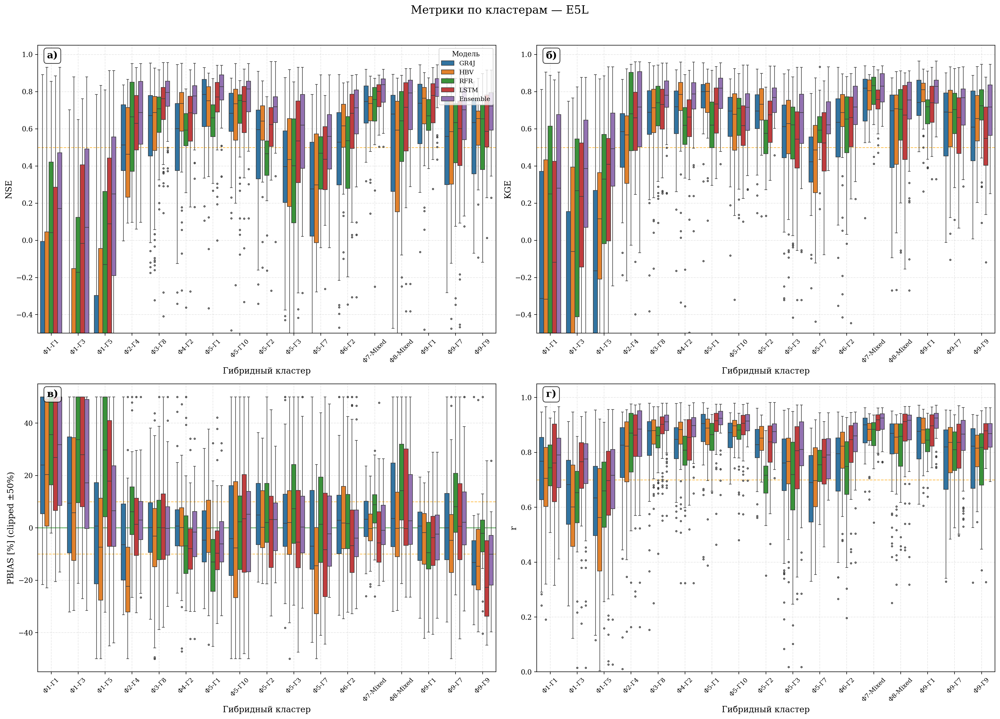


Creating boxplots for GPCP...
Saved: ../res/chapter_two/cluster_analysis/boxplots/cluster_boxplots_gpcp.png
Saved: ../res/chapter_two/cluster_analysis/boxplots/cluster_boxplots_gpcp.png


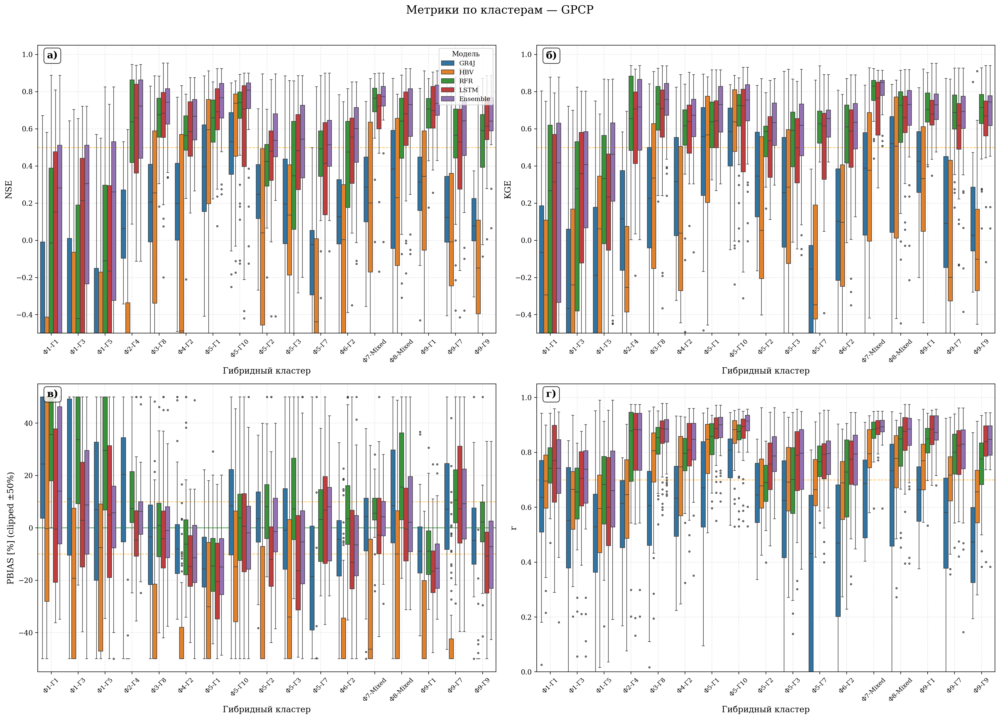


Creating boxplots for E5...
Saved: ../res/chapter_two/cluster_analysis/boxplots/cluster_boxplots_e5.png
Saved: ../res/chapter_two/cluster_analysis/boxplots/cluster_boxplots_e5.png


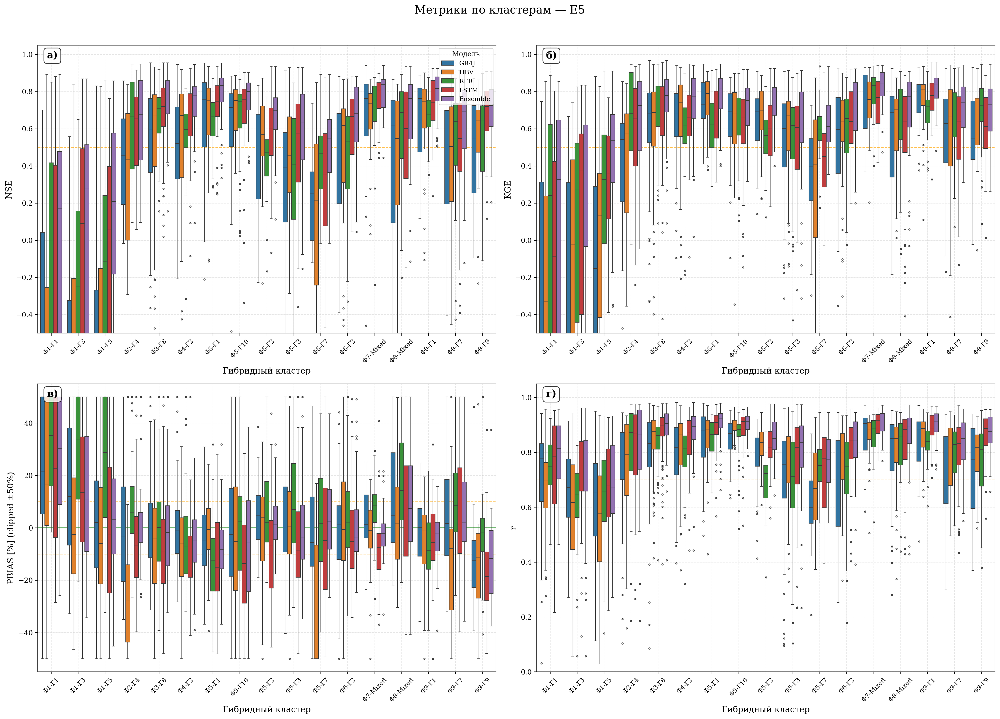


Creating boxplots for MSWEP...
Saved: ../res/chapter_two/cluster_analysis/boxplots/cluster_boxplots_mswep.png
Saved: ../res/chapter_two/cluster_analysis/boxplots/cluster_boxplots_mswep.png


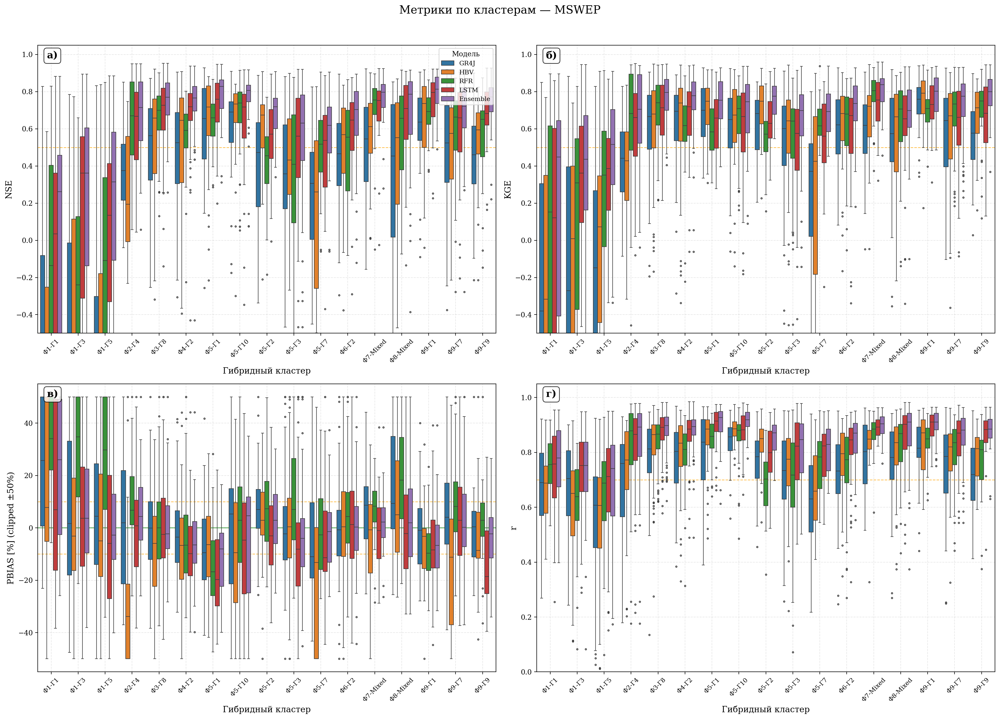

In [16]:
# =============================================================================
# Function: Create multi-metric boxplots by cluster for a given source
# =============================================================================


def create_cluster_boxplots(
    source_models: dict[str, pd.DataFrame],
    ensemble_df: pd.DataFrame,
    hybrid_classes: pd.Series,
    source_name: str,
    metrics: list[str] = ["NSE", "KGE", "PBIAS", "r"],
    pbias_bins: list[float] = [-50, -20, -10, 10, 20, 50],
    output_dir: Path | None = None,
) -> plt.Figure:
    """Create faceted boxplots comparing all models across clusters for each metric."""

    # Prepare data in long format
    _all_data = []

    for _model, _df in source_models.items():
        _model_data = _df[metrics].copy()
        _model_data["model"] = _model
        _model_data["hybrid_class"] = hybrid_classes
        _all_data.append(_model_data)

    # Add ensemble
    _ensemble_data = ensemble_df[metrics].copy()
    _ensemble_data["model"] = "Ensemble"
    _ensemble_data["hybrid_class"] = hybrid_classes
    _all_data.append(_ensemble_data)

    _combined = pd.concat(_all_data, ignore_index=True)
    _combined = _combined.dropna(subset=["hybrid_class"])

    # Create figure with subplots for each metric
    _fig, _axes = plt.subplots(2, 2, figsize=(20, 14))
    _axes = _axes.flatten()

    _model_order = ["GR4J", "HBV", "RFR", "LSTM", "Ensemble"]
    _colors = get_cluster_colors(len(_model_order))
    _palette = dict(zip(_model_order, _colors))

    # Russian labels
    _ru_labels = ["а)", "б)", "в)", "г)"]

    for _idx, _metric in enumerate(metrics):
        _ax = _axes[_idx]

        # Special handling for PBIAS - clip extreme values
        if _metric == "PBIAS":
            _plot_data = _combined.copy()
            _plot_data[_metric] = _plot_data[_metric].clip(-50, 50)
            _ylabel = "PBIAS [%] (clipped ±50%)"
            _ylim = (-55, 55)
            # Add threshold lines
            _ax.axhline(y=10, color="orange", linestyle="--", alpha=0.7, linewidth=1)
            _ax.axhline(y=-10, color="orange", linestyle="--", alpha=0.7, linewidth=1)
            _ax.axhline(y=0, color="green", linestyle="-", alpha=0.5, linewidth=1.5)
        else:
            _plot_data = _combined
            _ylabel = _metric
            if _metric in ["NSE", "KGE"]:
                _ylim = (-0.5, 1.05)
                _ax.axhline(y=0.5, color="orange", linestyle="--", alpha=0.7, linewidth=1)
            else:  # r
                _ylim = (0, 1.05)
                _ax.axhline(y=0.7, color="orange", linestyle="--", alpha=0.7, linewidth=1)

        sns.boxplot(
            data=_plot_data,
            x="hybrid_class",
            y=_metric,
            hue="model",
            hue_order=_model_order,
            palette=_palette,
            ax=_ax,
            linewidth=0.8,
            fliersize=2,
            order=sorted(_combined["hybrid_class"].dropna().unique()),
        )

        _ax.set_xlabel("Гибридный кластер", fontsize=12)
        _ax.set_ylabel(_ylabel, fontsize=12)
        _ax.set_ylim(_ylim)
        _ax.tick_params(axis="x", rotation=45, labelsize=9)
        _ax.tick_params(axis="y", labelsize=10)
        _ax.grid(True, alpha=0.3, linestyle="--")

        # Add Russian label
        _ax.text(
            0.02,
            0.98,
            _ru_labels[_idx],
            transform=_ax.transAxes,
            fontsize=14,
            fontweight="bold",
            va="top",
            ha="left",
            bbox={"boxstyle": "round,pad=0.3", "facecolor": "white", "alpha": 0.8},
        )

        # Legend only on first plot
        if _idx == 0:
            _ax.legend(title="Модель", loc="upper right", fontsize=9)
        else:
            _ax.get_legend().remove()

    _fig.suptitle(f"Метрики по кластерам — {source_name.upper()}", fontsize=16, y=1.02)
    plt.tight_layout()

    if output_dir is not None:
        _save_path = output_dir / "boxplots" / f"cluster_boxplots_{source_name}.png"
        _fig.savefig(_save_path, dpi=300, bbox_inches="tight")
        print(f"Saved: {_save_path}")

    return _fig


# Create boxplots for each source
for _source in SOURCES:
    print(f"\nCreating boxplots for {_source.upper()}...")
    _fig = create_cluster_boxplots(
        source_data[_source],
        ensemble_by_source[_source],
        hybrid_classes,
        _source,
        METRICS,
        PBIAS_BINS,
        OUTPUT_DIR,
    )
    plt.show()
    plt.close(_fig)


Creating NSE hex maps for E5L...
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_nse_e5l.png
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_nse_e5l.png


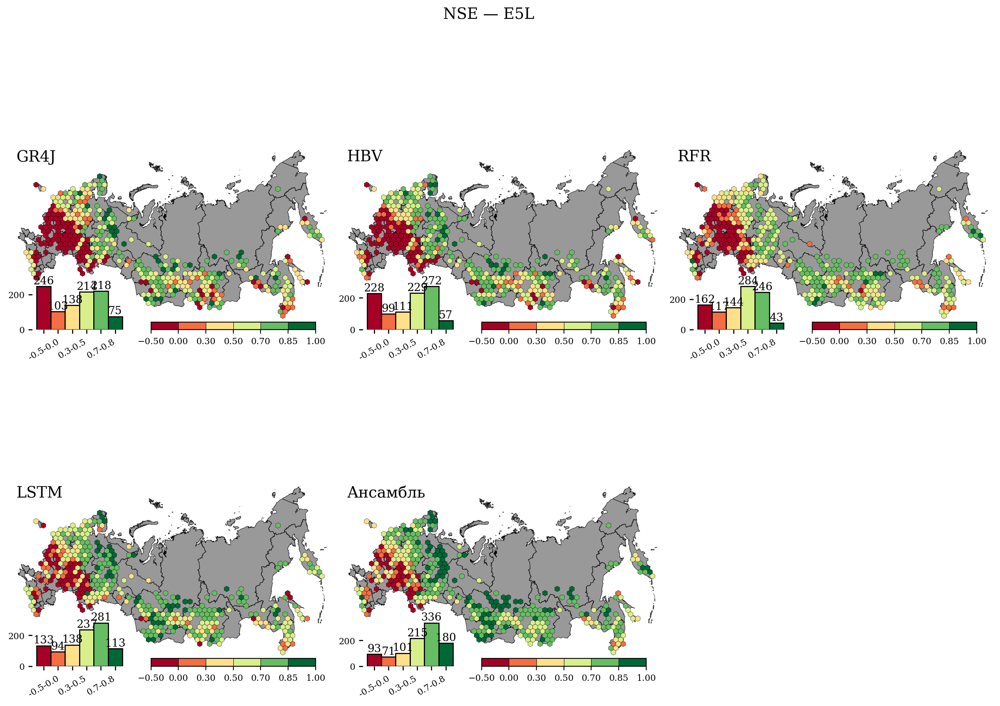


Creating NSE hex maps for GPCP...
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_nse_gpcp.png
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_nse_gpcp.png


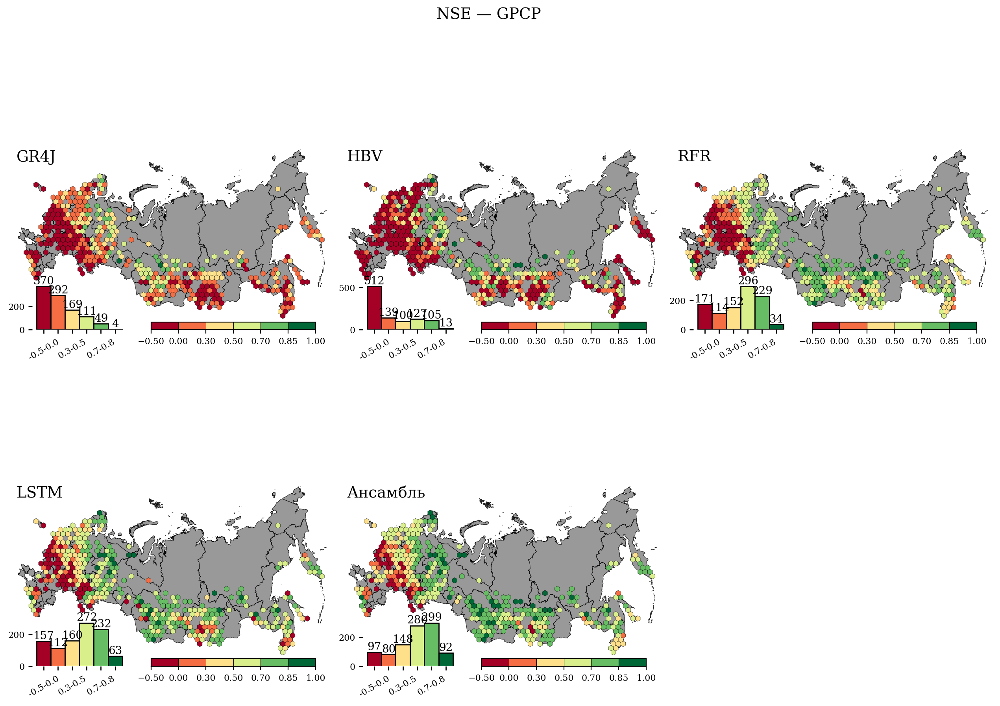


Creating NSE hex maps for E5...
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_nse_e5.png
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_nse_e5.png


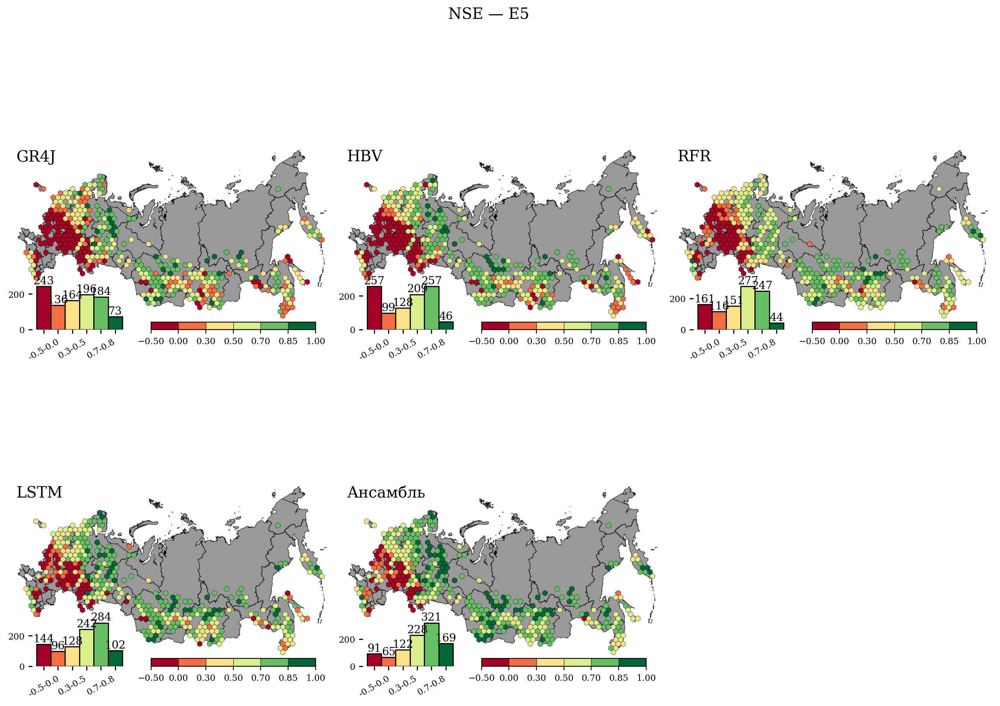


Creating NSE hex maps for MSWEP...
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_nse_mswep.png
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_nse_mswep.png


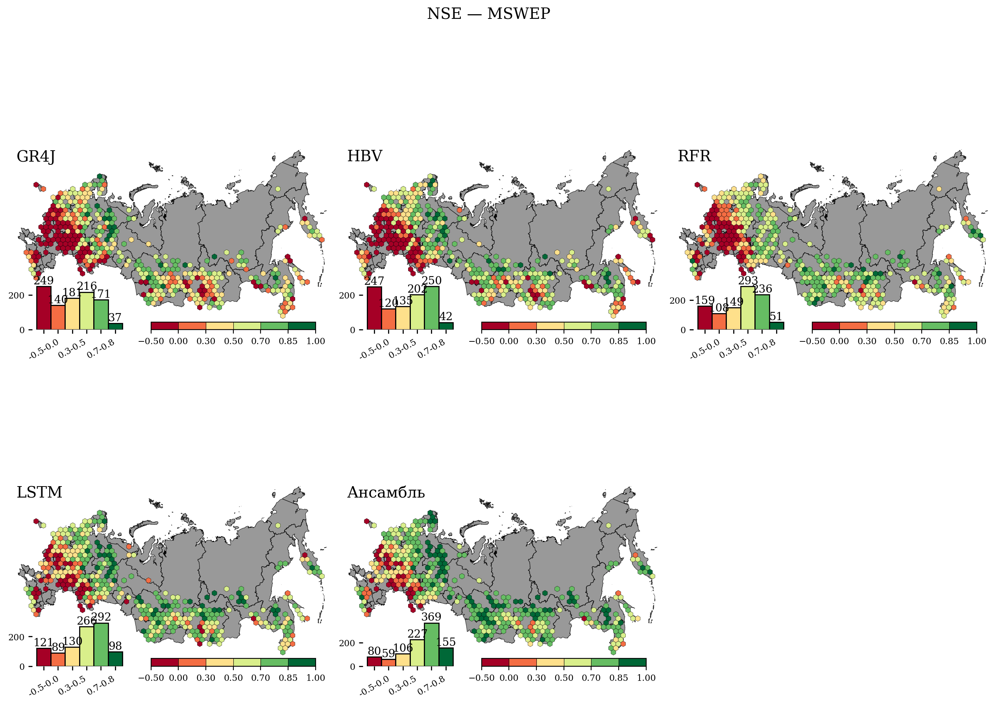

In [17]:
# =============================================================================
# Spatial hex maps: Model performance distribution
# =============================================================================


def create_metric_hex_maps(
    source_models: dict[str, pd.DataFrame],
    ensemble_df: pd.DataFrame,
    watersheds: gpd.GeoDataFrame,
    basemap: gpd.GeoDataFrame,
    source_name: str,
    metric: str = "NSE",
    output_dir: Path | None = None,
) -> plt.Figure:
    """Create hex-aggregated spatial maps for a metric across all models."""

    # Prepare watersheds with metrics
    _ws_data = watersheds.copy()

    # Add metric from each model
    _metric_cols = []
    for _model, _df in source_models.items():
        _col_name = f"{_model}_{metric}"
        _ws_data[_col_name] = _df[metric].reindex(_ws_data.index)
        _metric_cols.append(_col_name)

    # Add ensemble metric
    _ensemble_col = f"Ensemble_{metric}"
    _ws_data[_ensemble_col] = ensemble_df[metric].reindex(_ws_data.index)
    _metric_cols.append(_ensemble_col)

    # Define colormap limits based on metric
    if metric in ["NSE", "KGE"]:
        _list_of_limits = [-0.5, 0.0, 0.3, 0.5, 0.7, 0.85, 1.0]
        _cmap = "RdYlGn"
    elif metric == "r":
        _list_of_limits = [0.0, 0.5, 0.7, 0.8, 0.9, 0.95, 1.0]
        _cmap = "RdYlGn"
    elif metric == "PBIAS":
        _list_of_limits = [-50, -20, -10, 10, 20, 50]
        _cmap = "RdYlBu"
    else:
        _list_of_limits = None
        _cmap = "viridis"

    _labels = ["GR4J", "HBV", "RFR", "LSTM", "Ансамбль"]

    _fig, _hex_data, _r_km, _coverage = hexes_plots_n(
        watersheds=_ws_data,
        basemap_data=basemap,
        metric_cols=_metric_cols,
        label_list=_labels,
        nrows=2,
        ncols=3,
        list_of_limits=_list_of_limits,
        cmap_name=_cmap,
        figsize=(16, 10),
        agg="median",
        with_histogram=True,
    )

    _fig.suptitle(f"{metric} — {source_name.upper()}", fontsize=14, y=1.01)

    if output_dir is not None:
        _save_path = output_dir / "hex_maps" / f"hex_{metric.lower()}_{source_name}.png"
        _fig.savefig(_save_path, dpi=300, bbox_inches="tight")
        print(f"Saved: {_save_path}")

    return _fig


# Create hex maps for NSE (primary metric) for each source
for _source in SOURCES:
    print(f"\nCreating NSE hex maps for {_source.upper()}...")
    _fig = create_metric_hex_maps(
        source_data[_source],
        ensemble_by_source[_source],
        ws,
        basemap_data,
        _source,
        "NSE",
        OUTPUT_DIR,
    )
    plt.show()
    plt.close(_fig)


Creating NSE hex maps for MSWEP...
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_nse_mswep.png
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_nse_mswep.png


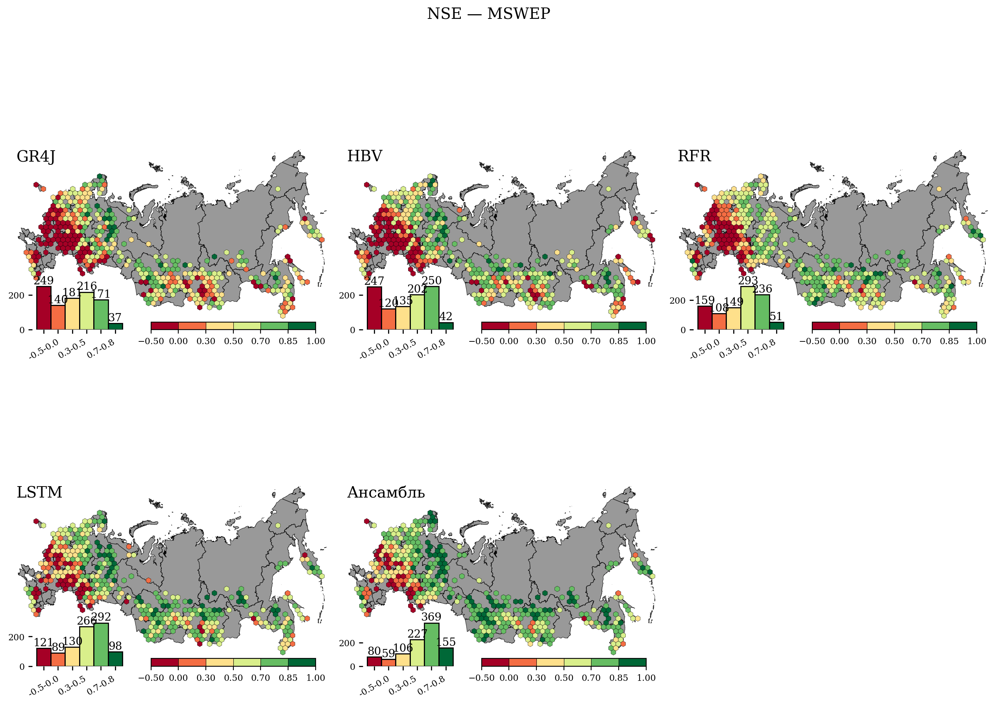


Creating KGE hex maps for MSWEP...
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_kge_mswep.png
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_kge_mswep.png


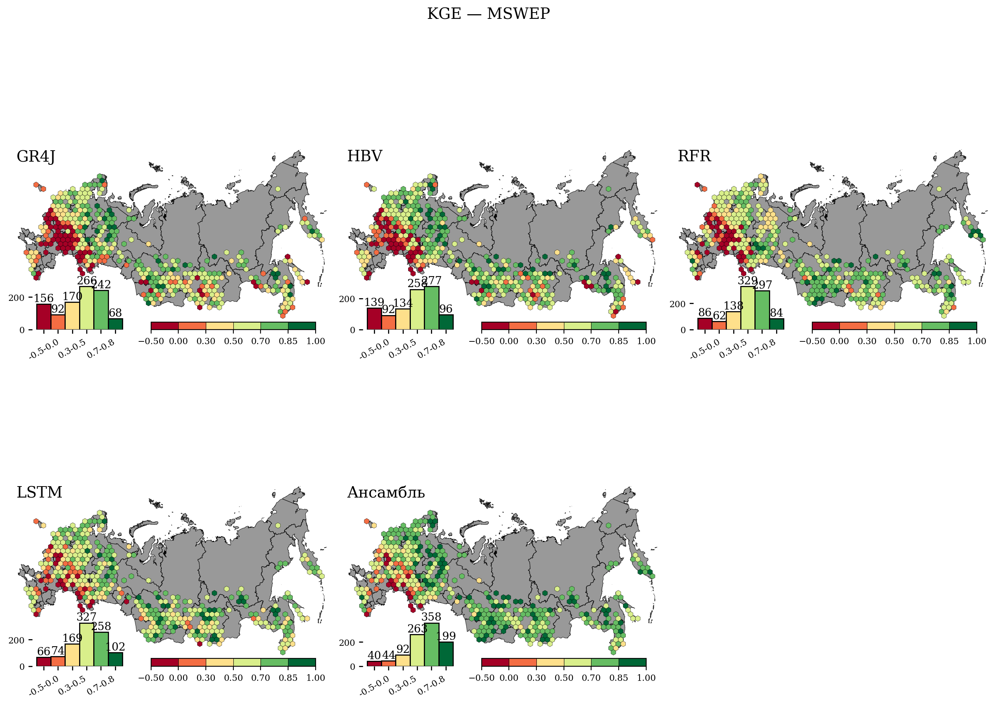


Creating PBIAS hex maps for MSWEP...
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_pbias_mswep.png
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_pbias_mswep.png


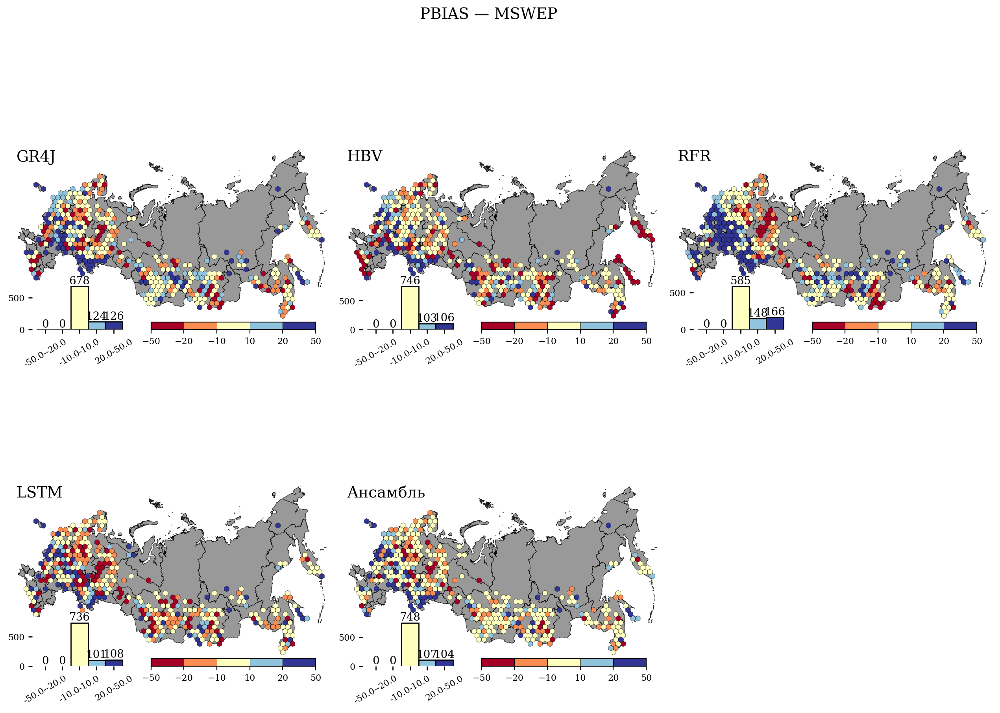


Creating r hex maps for MSWEP...
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_r_mswep.png
Saved: ../res/chapter_two/cluster_analysis/hex_maps/hex_r_mswep.png


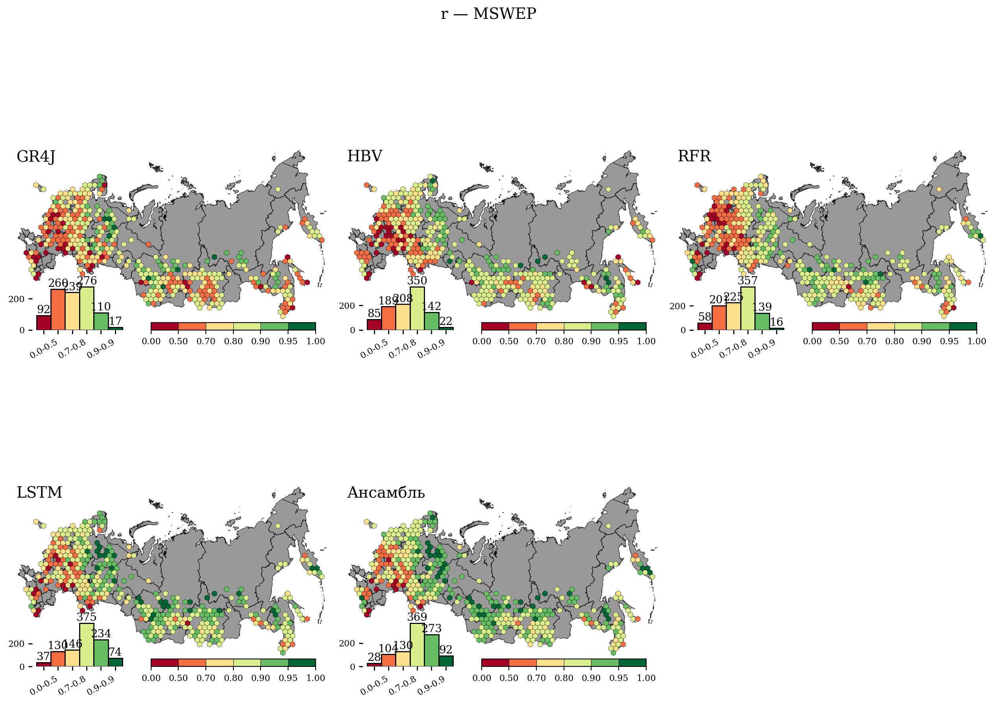

In [18]:
# =============================================================================
# Create hex maps for all metrics (MSWEP source - best overall)
# =============================================================================

for _metric in METRICS:
    print(f"\nCreating {_metric} hex maps for MSWEP...")
    _fig = create_metric_hex_maps(
        source_data["mswep"],
        ensemble_by_source["mswep"],
        ws,
        basemap_data,
        "mswep",
        _metric,
        OUTPUT_DIR,
    )
    plt.show()
    plt.close(_fig)

Creating NSE heatmap for E5L...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_nse_e5l.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_nse_e5l.png


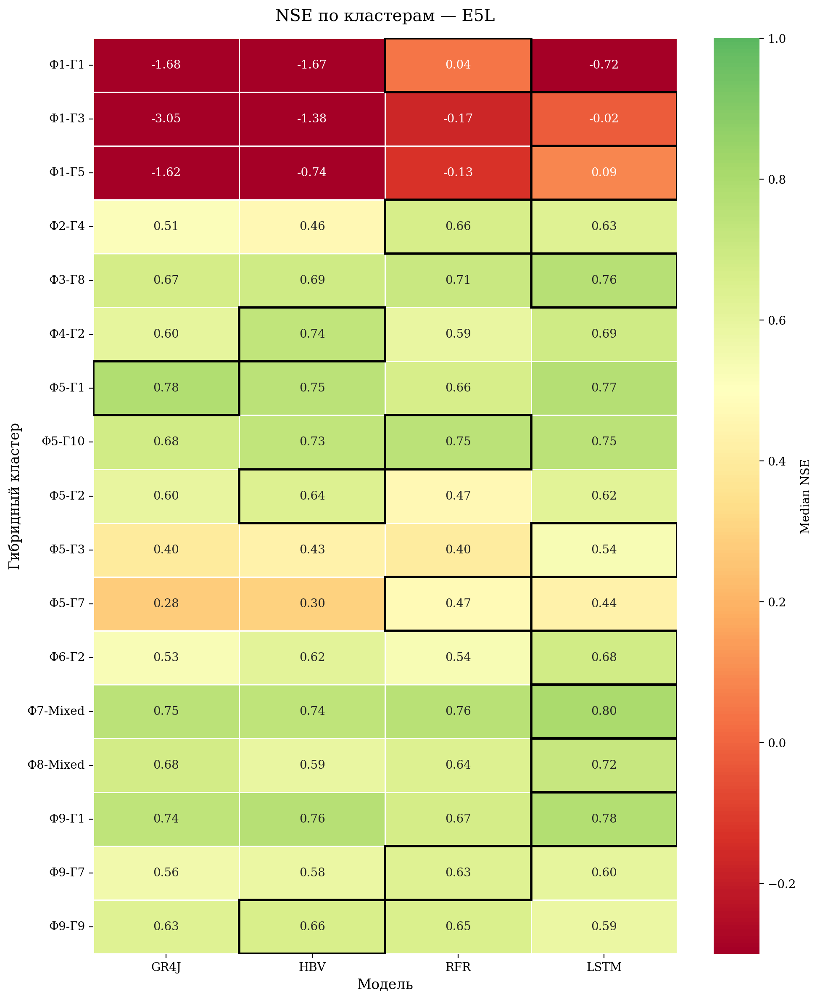

Creating KGE heatmap for E5L...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_kge_e5l.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_kge_e5l.png


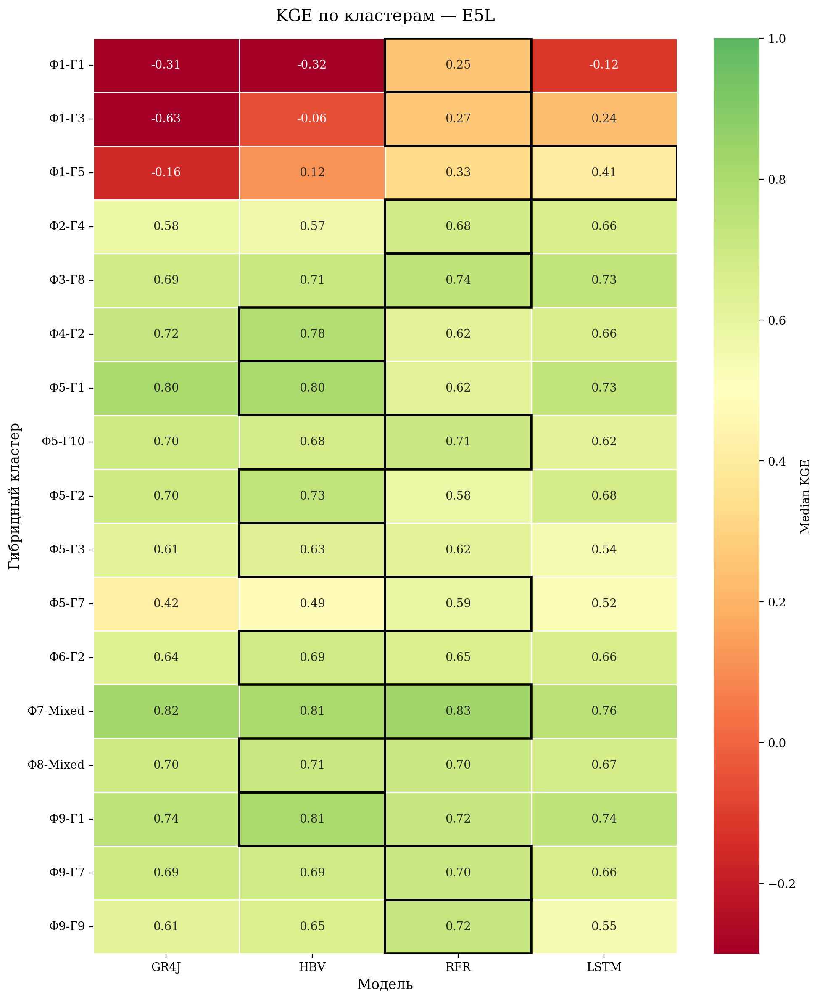

Creating PBIAS heatmap for E5L...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_pbias_e5l.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_pbias_e5l.png


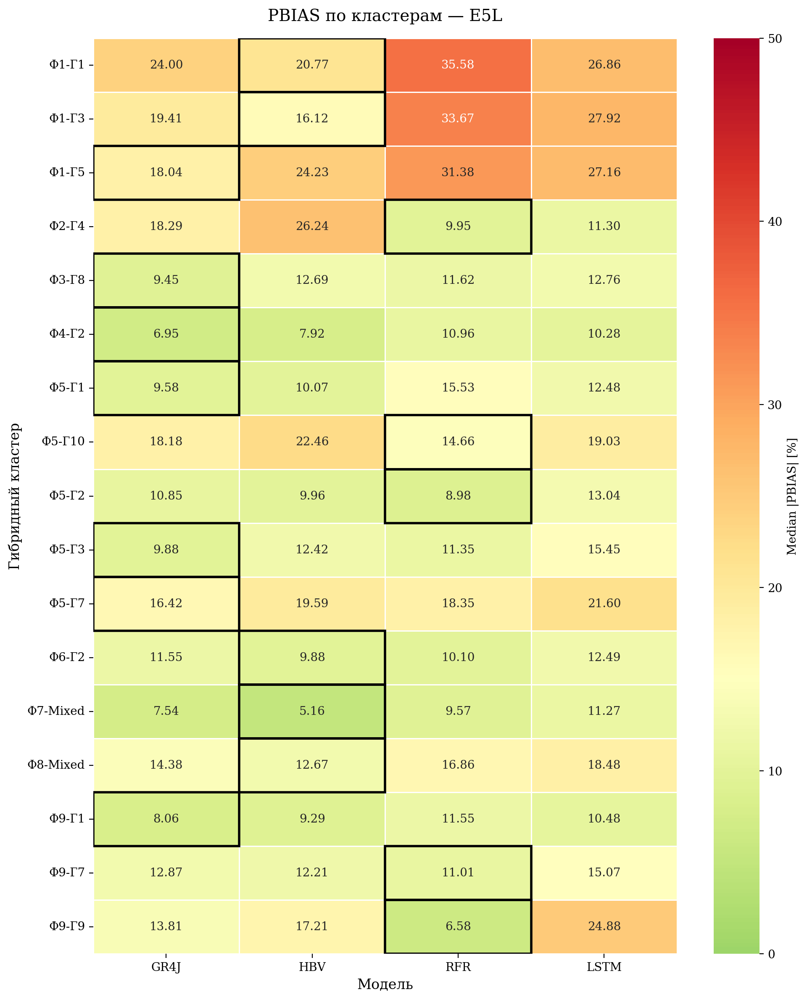

Creating r heatmap for E5L...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_r_e5l.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_r_e5l.png


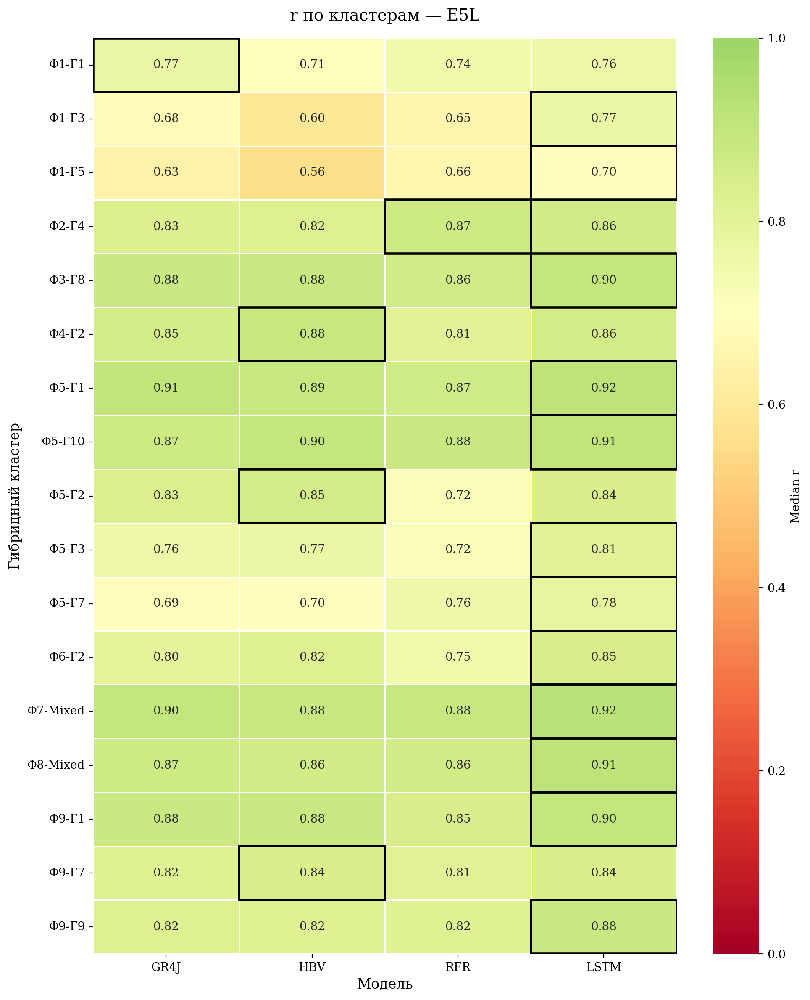

Creating NSE heatmap for GPCP...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_nse_gpcp.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_nse_gpcp.png


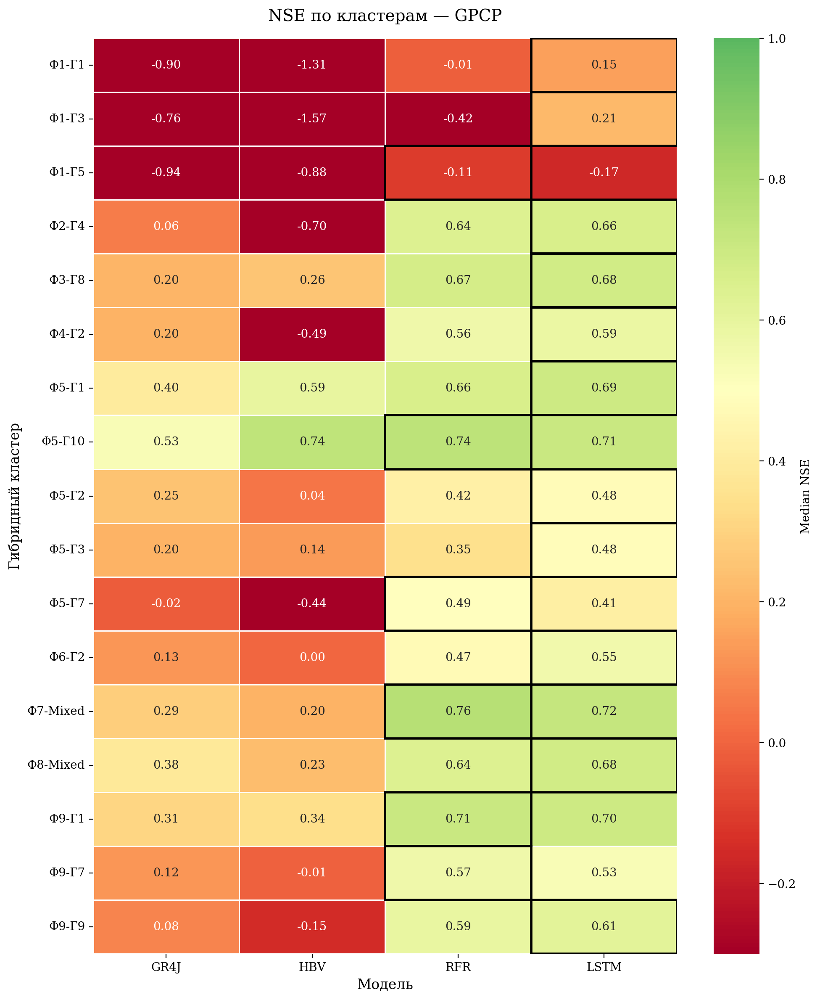

Creating KGE heatmap for GPCP...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_kge_gpcp.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_kge_gpcp.png


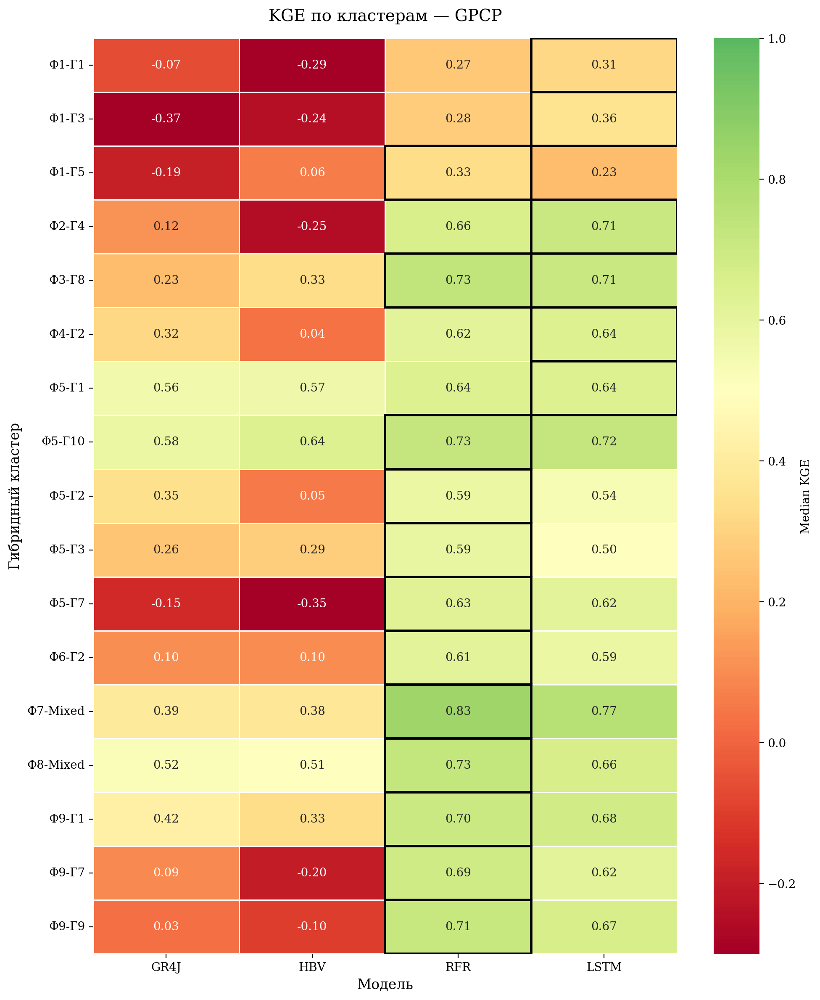

Creating PBIAS heatmap for GPCP...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_pbias_gpcp.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_pbias_gpcp.png


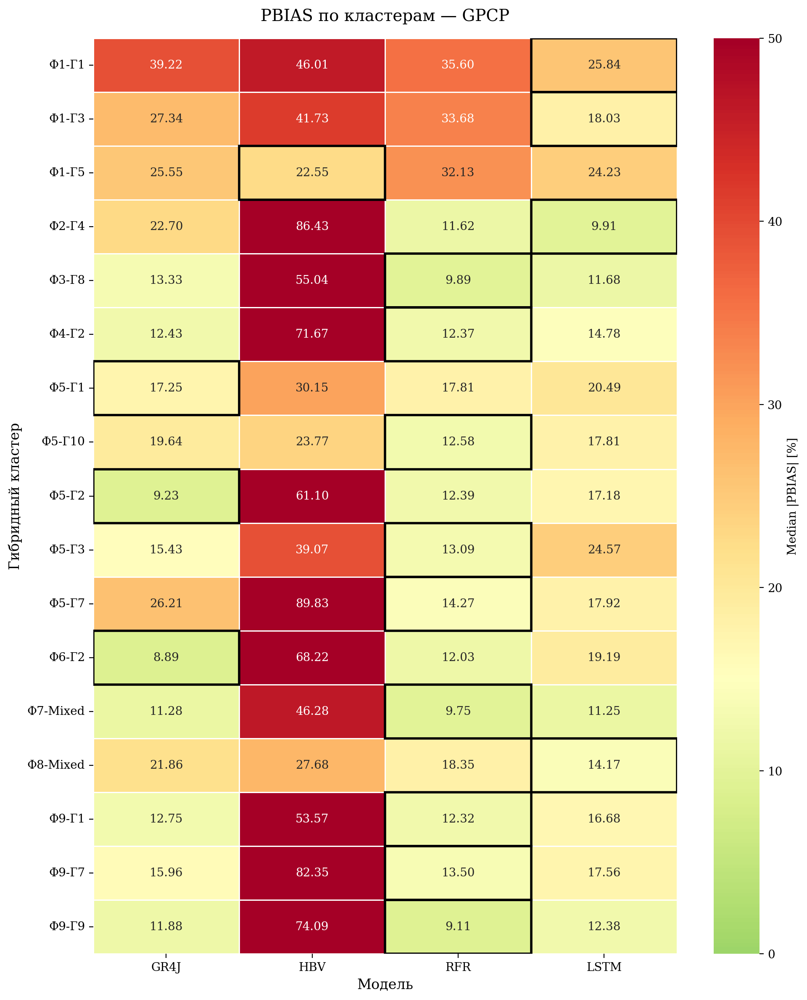

Creating r heatmap for GPCP...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_r_gpcp.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_r_gpcp.png


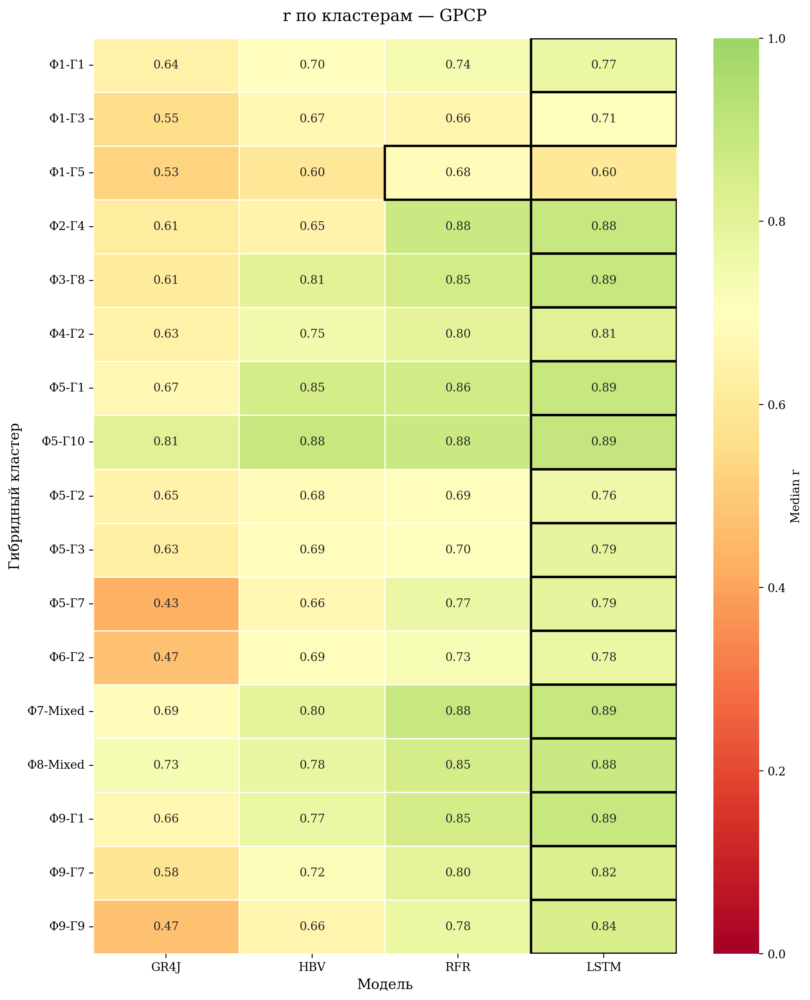

Creating NSE heatmap for E5...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_nse_e5.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_nse_e5.png


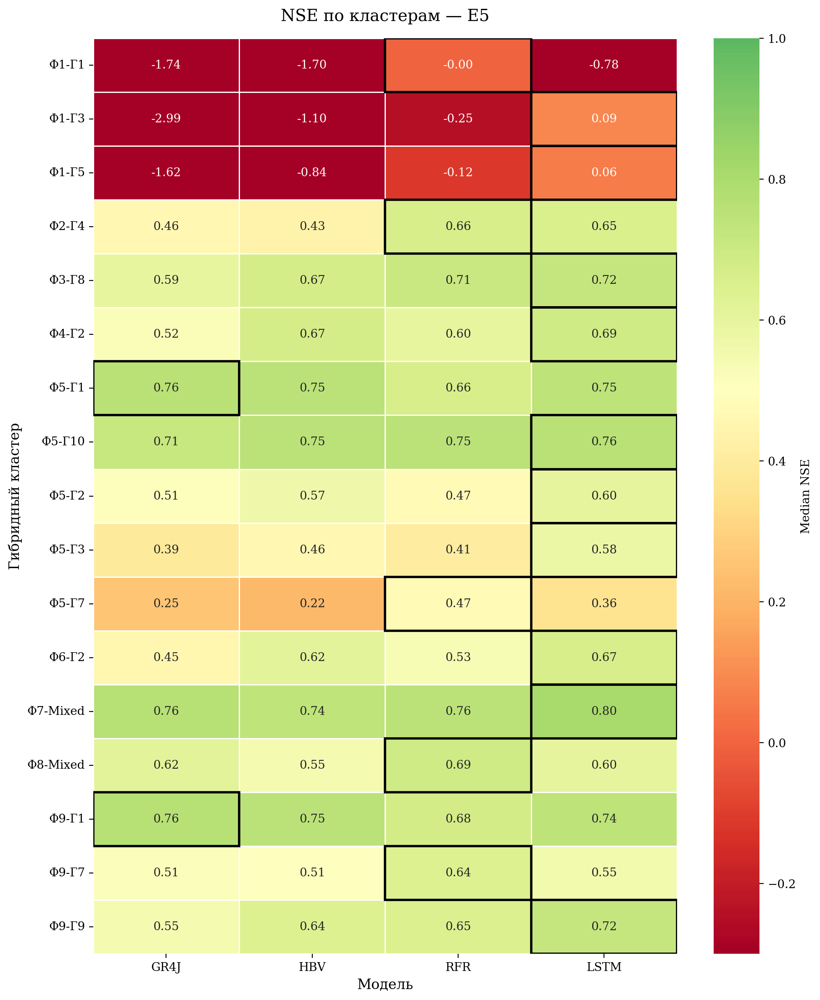

Creating KGE heatmap for E5...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_kge_e5.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_kge_e5.png


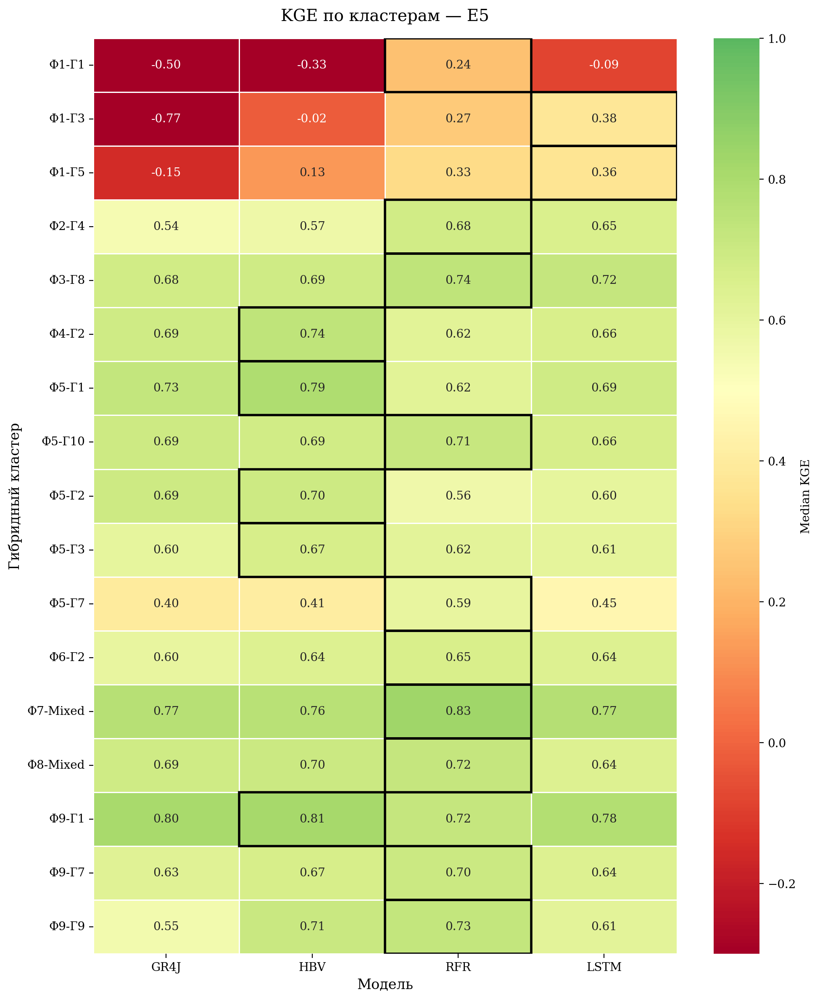

Creating PBIAS heatmap for E5...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_pbias_e5.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_pbias_e5.png


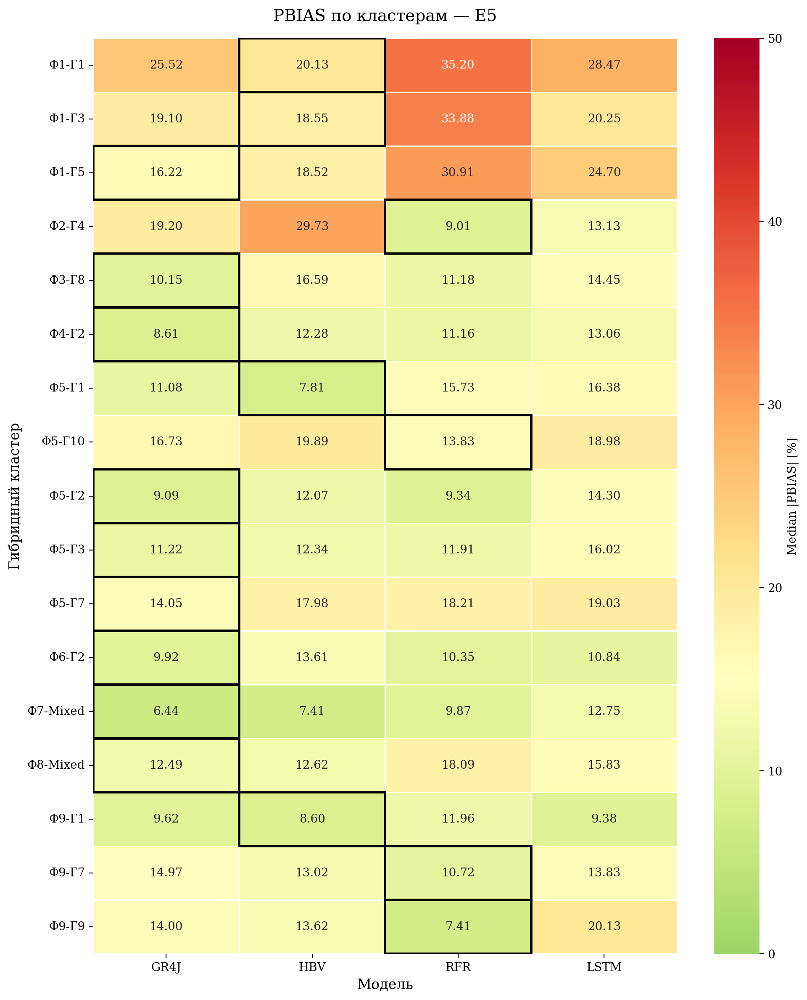

Creating r heatmap for E5...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_r_e5.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_r_e5.png


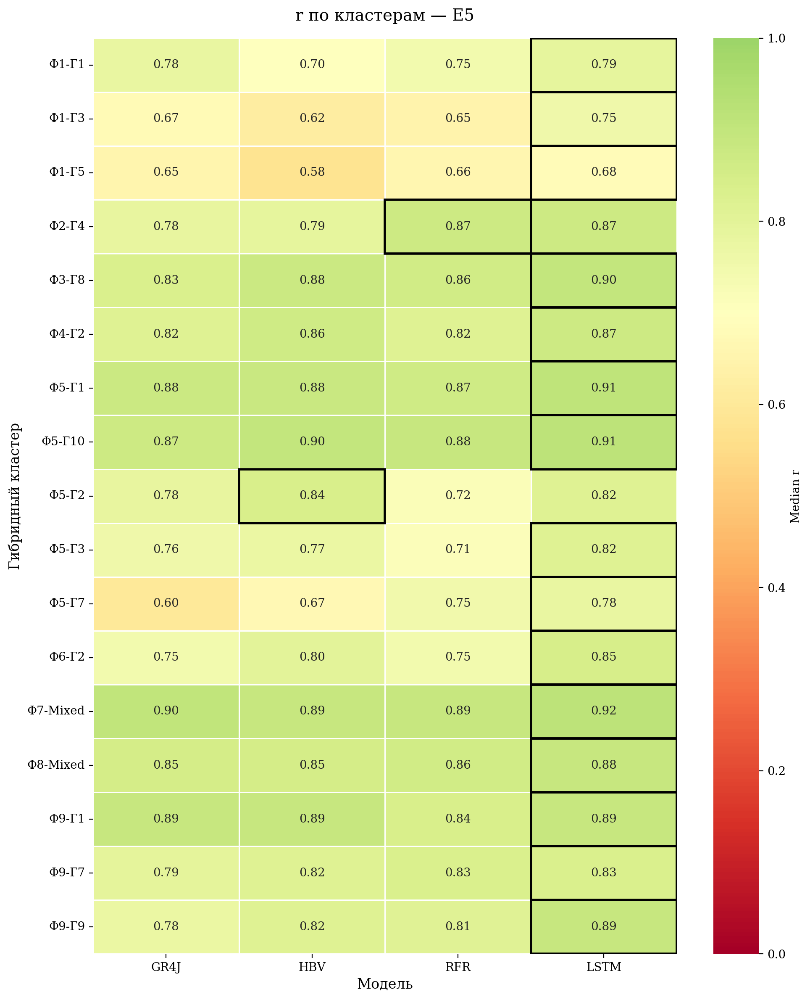

Creating NSE heatmap for MSWEP...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_nse_mswep.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_nse_mswep.png


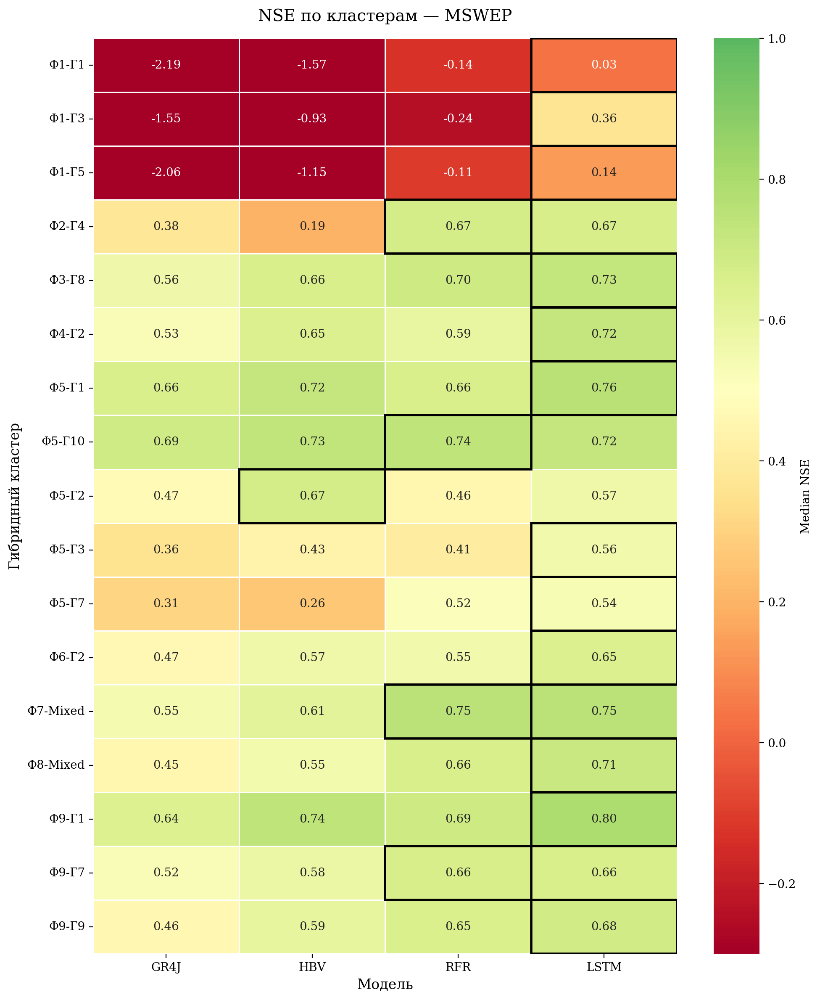

Creating KGE heatmap for MSWEP...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_kge_mswep.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_kge_mswep.png


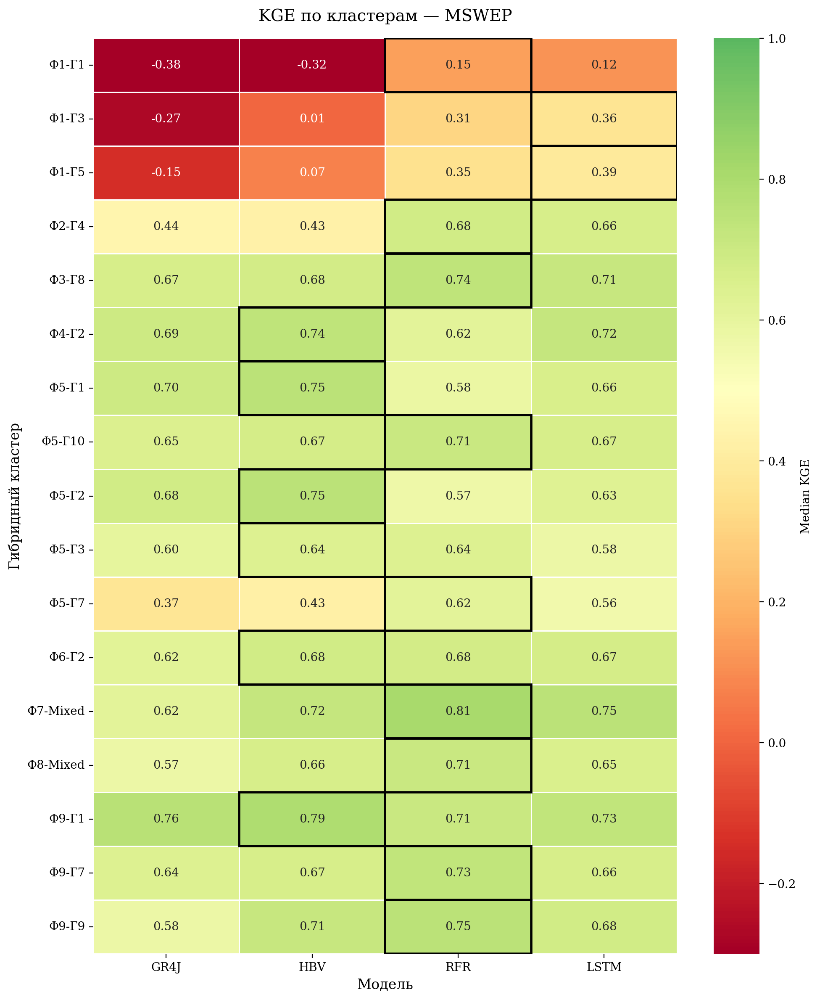

Creating PBIAS heatmap for MSWEP...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_pbias_mswep.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_pbias_mswep.png


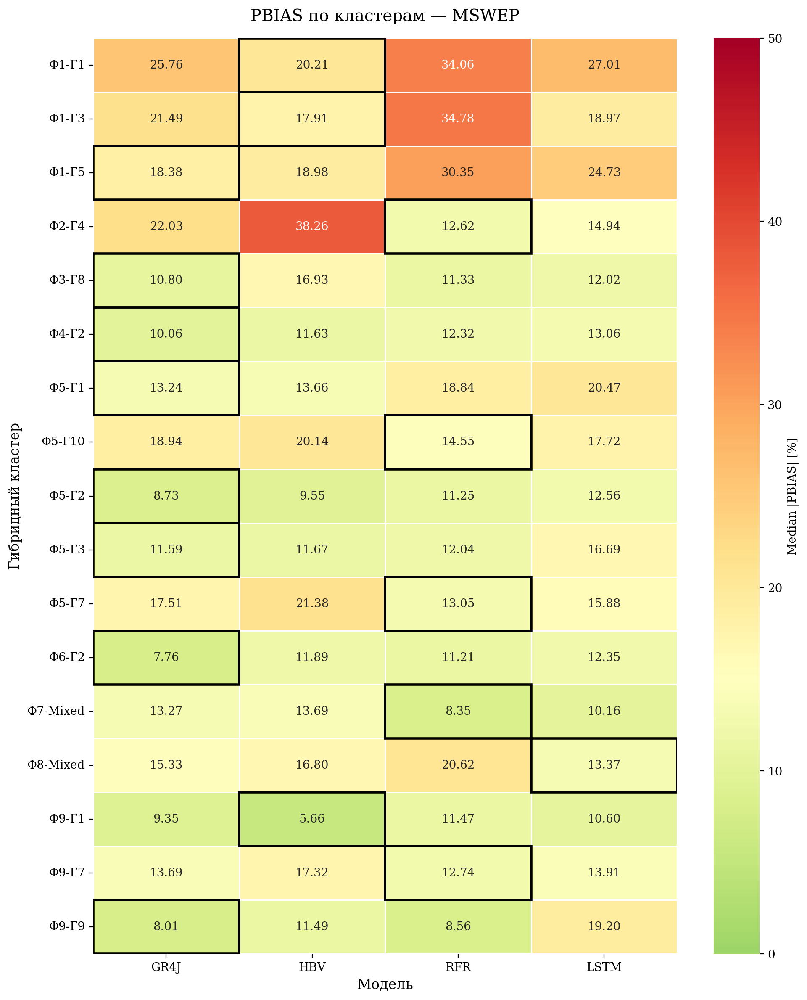

Creating r heatmap for MSWEP...
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_r_mswep.png
Saved: ../res/chapter_two/cluster_analysis/heatmaps/heatmap_r_mswep.png


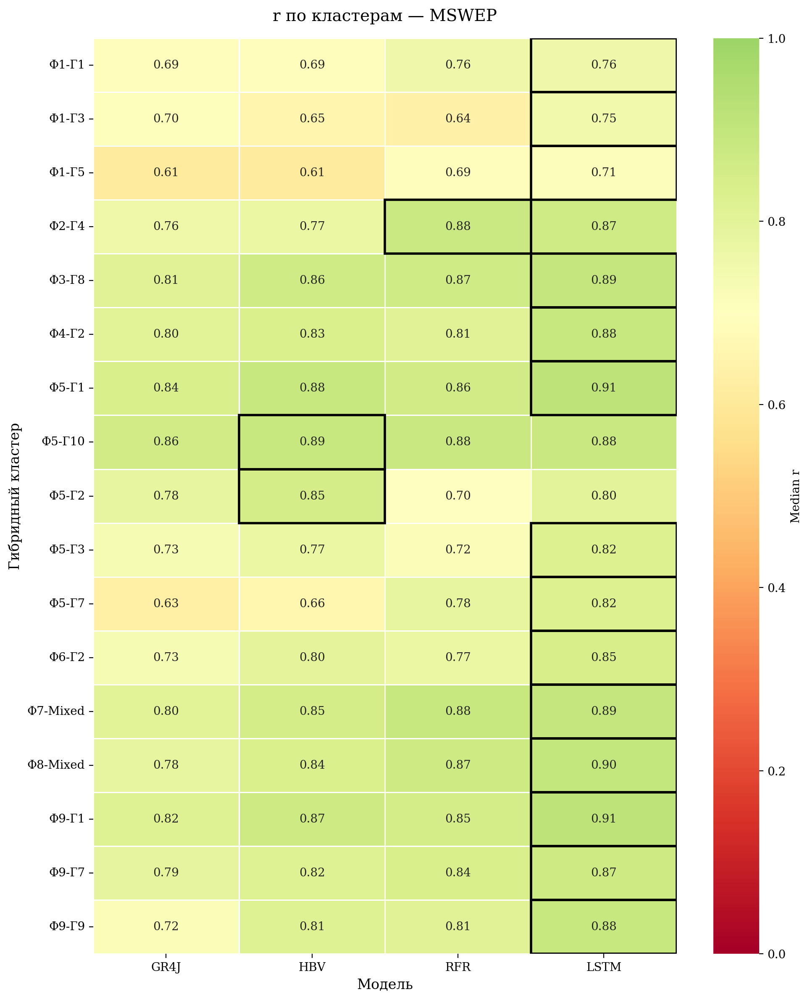

In [19]:
# =============================================================================
# Cluster × Model Heatmaps: Which model performs best in which cluster?
# =============================================================================


def create_cluster_model_heatmap(
    source_models: dict[str, pd.DataFrame],
    hybrid_classes: pd.Series,
    source_name: str,
    metric: str = "NSE",
    output_dir: Path | None = None,
) -> plt.Figure:
    """Create heatmap showing median metric per (cluster, model) combination."""

    # Build matrix: rows = clusters, columns = models
    _clusters = sorted(hybrid_classes.dropna().unique())
    _models = list(source_models.keys())

    _matrix = pd.DataFrame(index=_clusters, columns=_models, dtype=float)

    for _cluster in _clusters:
        _cluster_mask = hybrid_classes == _cluster
        _cluster_gauges = hybrid_classes[_cluster_mask].index

        for _model in _models:
            _df = source_models[_model]
            if metric == "PBIAS":
                # Use absolute value for PBIAS
                _matrix.loc[_cluster, _model] = (
                    _df.loc[_cluster_gauges, metric].abs().median()
                )
            else:
                _matrix.loc[_cluster, _model] = _df.loc[_cluster_gauges, metric].median()

    # Create figure
    _fig, _ax = plt.subplots(figsize=(10, 12))

    # Determine colormap based on metric
    if metric in ["NSE", "KGE", "r"]:
        _cmap = "RdYlGn"
        _center = 0.5 if metric in ["NSE", "KGE"] else 0.7
        _vmin, _vmax = -0.3 if metric != "r" else 0, 1.0
    else:  # PBIAS
        _cmap = "RdYlGn_r"
        _center = 15
        _vmin, _vmax = 0, 50

    sns.heatmap(
        _matrix.astype(float),
        annot=True,
        fmt=".2f",
        cmap=_cmap,
        center=_center,
        vmin=_vmin,
        vmax=_vmax,
        linewidths=0.5,
        ax=_ax,
        cbar_kws={
            "label": f"Median {metric}" if metric != "PBIAS" else "Median |PBIAS| [%]"
        },
    )

    _ax.set_xlabel("Модель", fontsize=12)
    _ax.set_ylabel("Гибридный кластер", fontsize=12)
    _ax.set_title(f"{metric} по кластерам — {source_name.upper()}", fontsize=14, pad=15)

    # Highlight best model per cluster
    for _i, _cluster in enumerate(_clusters):
        if metric == "PBIAS":
            _best_model_idx = _matrix.loc[_cluster].astype(float).idxmin()
        else:
            _best_model_idx = _matrix.loc[_cluster].astype(float).idxmax()
        _j = _models.index(_best_model_idx)
        _ax.add_patch(plt.Rectangle((_j, _i), 1, 1, fill=False, edgecolor="black", lw=2))

    plt.tight_layout()

    if output_dir is not None:
        _save_path = (
            output_dir / "heatmaps" / f"heatmap_{metric.lower()}_{source_name}.png"
        )
        _fig.savefig(_save_path, dpi=300, bbox_inches="tight")
        print(f"Saved: {_save_path}")

    return _fig


# Create heatmaps for each metric and source
for _source in SOURCES:
    for _metric in METRICS:
        print(f"Creating {_metric} heatmap for {_source.upper()}...")
        _fig = create_cluster_model_heatmap(
            source_data[_source],
            hybrid_classes,
            _source,
            _metric,
            OUTPUT_DIR,
        )
        plt.show()
        plt.close(_fig)

Saved: ../res/chapter_two/cluster_analysis/comparison/best_model_source_summary.png
Saved: ../res/chapter_two/cluster_analysis/comparison/best_model_source_per_cluster.csv


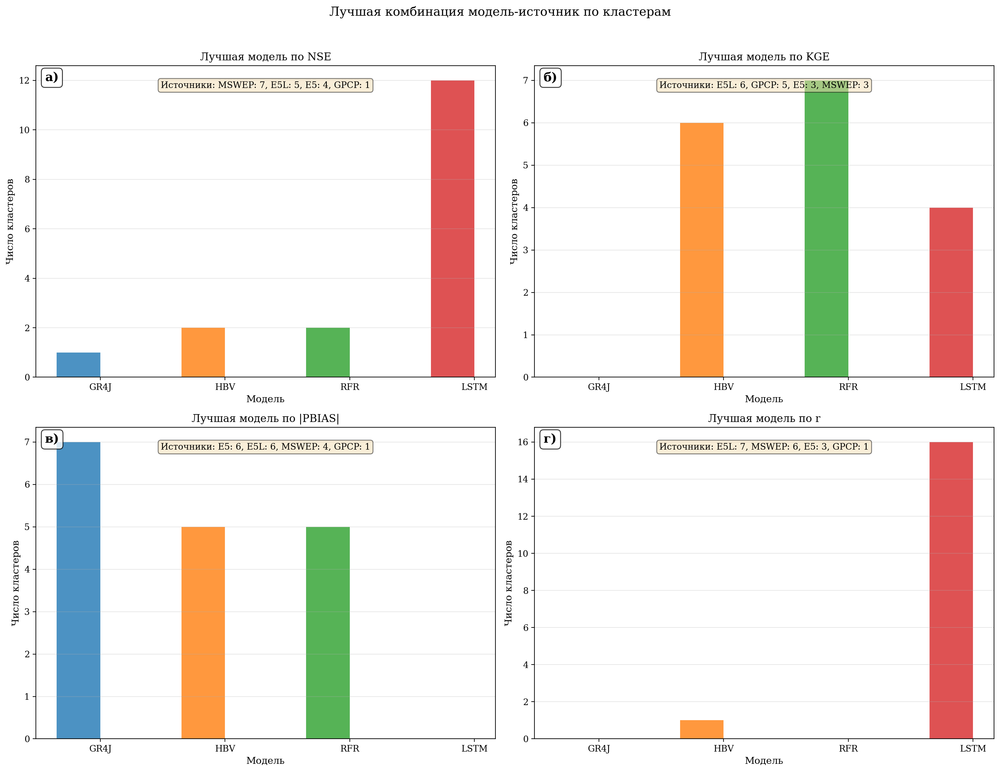


FINAL COMPARISON TABLE: Best Model-Source per Cluster


,N,Best_NSE,Best_Source_NSE,Best_Model_NSE,Best_KGE,Best_Source_KGE,Best_Model_KGE,Best_|PBIAS|,Best_Source_PBIAS,Best_Model_PBIAS,Best_r,Best_Source_r,Best_Model_r
Cluster,,,,,,,,,,,,,
Ф1-Г1,47,0.151797,GPCP,LSTM,0.314617,GPCP,LSTM,20.134524,E5,HBV,0.785705,E5,LSTM
Ф1-Г3,51,0.361716,MSWEP,LSTM,0.377530,E5,LSTM,16.119960,E5L,HBV,0.766280,E5L,LSTM
Ф1-Г5,102,0.135172,MSWEP,LSTM,0.409194,E5L,LSTM,16.218507,E5,GR4J,0.711632,MSWEP,LSTM
Ф2-Г4,28,0.670583,MSWEP,RFR,0.706922,GPCP,LSTM,9.006908,E5,RFR,0.883897,GPCP,LSTM
Ф3-Г8,127,0.762196,E5L,LSTM,0.740295,E5L,RFR,9.453389,E5L,GR4J,0.902074,E5L,LSTM
Ф4-Г2,80,0.735872,E5L,HBV,0.784562,E5L,HBV,6.946751,E5L,GR4J,0.884632,MSWEP,LSTM
Ф5-Г1,48,0.784752,E5L,GR4J,0.801776,E5L,HBV,7.805511,E5,HBV,0.915309,E5L,LSTM
Ф5-Г10,47,0.756754,E5,LSTM,0.725639,GPCP,RFR,12.582684,GPCP,RFR,0.912166,E5,LSTM
Ф5-Г2,43,0.674391,MSWEP,HBV,0.747789,MSWEP,HBV,8.730041,MSWEP,GR4J,0.852529,E5L,HBV


In [20]:
# =============================================================================
# FINAL COMPARISON: Best source and model per cluster
# =============================================================================


def create_final_comparison(
    source_data: dict[str, dict[str, pd.DataFrame]],
    hybrid_classes: pd.Series,
    metrics: list[str] = ["NSE", "KGE", "PBIAS", "r"],
    output_dir: Path | None = None,
) -> tuple[pd.DataFrame, plt.Figure]:
    """Create comprehensive comparison showing best source and model per cluster."""

    _clusters = sorted(hybrid_classes.dropna().unique())
    _sources = list(source_data.keys())
    _models = ["GR4J", "HBV", "RFR", "LSTM"]

    # Build comparison DataFrame
    _comparison_rows = []

    for _cluster in _clusters:
        _cluster_mask = hybrid_classes == _cluster
        _cluster_gauges = hybrid_classes[_cluster_mask].index
        _n_gauges = len(_cluster_gauges)

        _row = {"Cluster": _cluster, "N": _n_gauges}

        # Find best source × model combination for NSE
        _best_nse = -np.inf
        _best_source_nse = None
        _best_model_nse = None

        for _source in _sources:
            for _model in _models:
                _median_nse = (
                    source_data[_source][_model].loc[_cluster_gauges, "NSE"].median()
                )
                if _median_nse > _best_nse:
                    _best_nse = _median_nse
                    _best_source_nse = _source
                    _best_model_nse = _model

        _row["Best_NSE"] = _best_nse
        _row["Best_Source_NSE"] = _best_source_nse.upper()
        _row["Best_Model_NSE"] = _best_model_nse

        # Find best for KGE
        _best_kge = -np.inf
        _best_source_kge = None
        _best_model_kge = None

        for _source in _sources:
            for _model in _models:
                _median_kge = (
                    source_data[_source][_model].loc[_cluster_gauges, "KGE"].median()
                )
                if _median_kge > _best_kge:
                    _best_kge = _median_kge
                    _best_source_kge = _source
                    _best_model_kge = _model

        _row["Best_KGE"] = _best_kge
        _row["Best_Source_KGE"] = _best_source_kge.upper()
        _row["Best_Model_KGE"] = _best_model_kge

        # Find best for PBIAS (lowest absolute)
        _best_pbias = np.inf
        _best_source_pbias = None
        _best_model_pbias = None

        for _source in _sources:
            for _model in _models:
                _median_pbias = (
                    source_data[_source][_model]
                    .loc[_cluster_gauges, "PBIAS"]
                    .abs()
                    .median()
                )
                if _median_pbias < _best_pbias:
                    _best_pbias = _median_pbias
                    _best_source_pbias = _source
                    _best_model_pbias = _model

        _row["Best_|PBIAS|"] = _best_pbias
        _row["Best_Source_PBIAS"] = _best_source_pbias.upper()
        _row["Best_Model_PBIAS"] = _best_model_pbias

        # Find best for r
        _best_r = -np.inf
        _best_source_r = None
        _best_model_r = None

        for _source in _sources:
            for _model in _models:
                _median_r = (
                    source_data[_source][_model].loc[_cluster_gauges, "r"].median()
                )
                if _median_r > _best_r:
                    _best_r = _median_r
                    _best_source_r = _source
                    _best_model_r = _model

        _row["Best_r"] = _best_r
        _row["Best_Source_r"] = _best_source_r.upper()
        _row["Best_Model_r"] = _best_model_r

        _comparison_rows.append(_row)

    _comparison_df = pd.DataFrame(_comparison_rows).set_index("Cluster")

    # Create visualization: stacked bars showing best model/source distribution
    _fig, _axes = plt.subplots(2, 2, figsize=(16, 12))
    _axes = _axes.flatten()

    _metric_cols = [
        ("Best_Model_NSE", "Best_Source_NSE", "NSE"),
        ("Best_Model_KGE", "Best_Source_KGE", "KGE"),
        ("Best_Model_PBIAS", "Best_Source_PBIAS", "|PBIAS|"),
        ("Best_Model_r", "Best_Source_r", "r"),
    ]

    _ru_labels = ["а)", "б)", "в)", "г)"]
    _model_colors = dict(zip(_models, get_cluster_colors(4)))
    _source_markers = {"E5L": "o", "GPCP": "s", "E5": "^", "MSWEP": "D"}

    for _idx, (_model_col, _source_col, _metric_name) in enumerate(_metric_cols):
        _ax = _axes[_idx]

        # Count best models per cluster
        _model_counts = _comparison_df[_model_col].value_counts()
        _source_counts = _comparison_df[_source_col].value_counts()

        # Create grouped bar chart
        _x = np.arange(len(_models))
        _width = 0.35

        _model_vals = [_model_counts.get(_m, 0) for _m in _models]
        _ax.bar(
            _x - _width / 2,
            _model_vals,
            _width,
            label="Лучшая модель",
            color=[_model_colors[_m] for _m in _models],
            alpha=0.8,
        )

        # Add source distribution as text annotation
        _source_text = ", ".join([f"{_s}: {_c}" for _s, _c in _source_counts.items()])
        _ax.text(
            0.5,
            0.95,
            f"Источники: {_source_text}",
            transform=_ax.transAxes,
            fontsize=10,
            ha="center",
            va="top",
            bbox={"boxstyle": "round", "facecolor": "wheat", "alpha": 0.5},
        )

        _ax.set_xticks(_x)
        _ax.set_xticklabels(_models)
        _ax.set_xlabel("Модель", fontsize=11)
        _ax.set_ylabel("Число кластеров", fontsize=11)
        _ax.set_title(f"Лучшая модель по {_metric_name}", fontsize=12)
        _ax.grid(True, alpha=0.3, axis="y")

        # Add Russian label
        _ax.text(
            0.02,
            0.98,
            _ru_labels[_idx],
            transform=_ax.transAxes,
            fontsize=14,
            fontweight="bold",
            va="top",
            ha="left",
            bbox={"boxstyle": "round,pad=0.3", "facecolor": "white", "alpha": 0.8},
        )

    _fig.suptitle("Лучшая комбинация модель-источник по кластерам", fontsize=14, y=1.02)
    plt.tight_layout()

    if output_dir is not None:
        _save_path = output_dir / "comparison" / "best_model_source_summary.png"
        _fig.savefig(_save_path, dpi=300, bbox_inches="tight")
        print(f"Saved: {_save_path}")

        _csv_path = output_dir / "comparison" / "best_model_source_per_cluster.csv"
        _comparison_df.to_csv(_csv_path)
        print(f"Saved: {_csv_path}")

    return _comparison_df, _fig


# Create final comparison
comparison_df, comparison_fig = create_final_comparison(
    source_data,
    hybrid_classes,
    METRICS,
    OUTPUT_DIR,
)
plt.show()

print("\n" + "=" * 60)
print("FINAL COMPARISON TABLE: Best Model-Source per Cluster")
print("=" * 60)
display(comparison_df)

In [21]:
# =============================================================================
# Summary: Overall best model per metric across all sources
# =============================================================================

print("\n" + "=" * 60)
print("OVERALL SUMMARY: Model Performance Across All Clusters")
print("=" * 60)

# Compute overall median metrics for each model × source combination
_overall_summary = []

for _source in SOURCES:
    for _model in MODELS:
        _df = source_data[_source][_model]
        _row = {
            "Source": _source.upper(),
            "Model": _model,
            "NSE_median": _df["NSE"].median(),
            "NSE_satisfactory": (_df["NSE"] >= 0.5).sum(),
            "KGE_median": _df["KGE"].median(),
            "KGE_satisfactory": (_df["KGE"] >= 0.5).sum(),
            "PBIAS_median": _df["PBIAS"].abs().median(),
            "PBIAS_good": (_df["PBIAS"].abs() <= 10).sum(),
            "r_median": _df["r"].median(),
            "r_satisfactory": (_df["r"] >= 0.7).sum(),
        }
        _overall_summary.append(_row)

overall_df = pd.DataFrame(_overall_summary)
overall_df["NSE_pct"] = overall_df["NSE_satisfactory"] / len(common_index) * 100
overall_df["KGE_pct"] = overall_df["KGE_satisfactory"] / len(common_index) * 100
overall_df["PBIAS_pct"] = overall_df["PBIAS_good"] / len(common_index) * 100
overall_df["r_pct"] = overall_df["r_satisfactory"] / len(common_index) * 100

# Save overall summary
_csv_path = OUTPUT_DIR / "comparison" / "overall_model_source_summary.csv"
overall_df.to_csv(_csv_path, index=False)
print(f"Saved: {_csv_path}")

# Display formatted summary
display(
    overall_df.style.format(
        {
            "NSE_median": "{:.3f}",
            "KGE_median": "{:.3f}",
            "PBIAS_median": "{:.1f}",
            "r_median": "{:.3f}",
            "NSE_pct": "{:.1f}%",
            "KGE_pct": "{:.1f}%",
            "PBIAS_pct": "{:.1f}%",
            "r_pct": "{:.1f}%",
        }
    )
    .background_gradient(
        subset=["NSE_median", "KGE_median", "r_median"],
        cmap="RdYlGn",
        vmin=0,
        vmax=1,
    )
    .background_gradient(
        subset=["PBIAS_median"],
        cmap="RdYlGn_r",
        vmin=0,
        vmax=30,
    )
)

print("\n✓ Cluster-based analysis complete!")
print(f"✓ All outputs saved to: {OUTPUT_DIR}")


OVERALL SUMMARY: Model Performance Across All Clusters
Saved: ../res/chapter_two/cluster_analysis/comparison/overall_model_source_summary.csv


,Source,Model,NSE_median,NSE_satisfactory,KGE_median,KGE_satisfactory,PBIAS_median,PBIAS_good,r_median,r_satisfactory,NSE_pct,KGE_pct,PBIAS_pct,r_pct
0,E5L,GR4J,0.519,507,0.632,634,12.4,437,0.819,730,50.9%,63.7%,43.9%,73.3%
1,E5L,HBV,0.563,558,0.658,668,13.1,407,0.831,756,56.0%,67.1%,40.9%,75.9%
2,E5L,RFR,0.557,573,0.633,695,13.5,390,0.802,731,57.5%,69.8%,39.2%,73.4%
3,E5L,LSTM,0.621,631,0.629,659,15.0,351,0.855,817,63.4%,66.2%,35.2%,82.0%
4,GPCP,GR4J,0.144,164,0.189,258,16.6,337,0.610,341,16.5%,25.9%,33.8%,34.2%
5,GPCP,HBV,-0.038,245,0.139,288,51.1,171,0.727,552,24.6%,28.9%,17.2%,55.4%
6,GPCP,RFR,0.544,559,0.629,701,14.1,378,0.792,726,56.1%,70.4%,38.0%,72.9%
7,GPCP,LSTM,0.566,567,0.588,622,17.4,309,0.831,753,56.9%,62.4%,31.0%,75.6%
8,E5,GR4J,0.454,453,0.605,610,12.8,421,0.789,681,45.5%,61.2%,42.3%,68.4%
9,E5,HBV,0.516,512,0.636,638,14.2,367,0.819,717,51.4%,64.1%,36.8%,72.0%



✓ Cluster-based analysis complete!
✓ All outputs saved to: ../res/chapter_two/cluster_analysis
